

# EDA on InsaidTelecom

---
# **Table of Contents**
---

**1.** [**Introduction**](#Section1)<br>
**2.** [**Problem Statement**](#Section2)<br>
**3.** [**Installing & Importing Libraries**](#Section3)<br>
**4.** [**Data Acquisition & Description**](#Section4)<br>
   - **4.1** [**Acquiring data from SQL Database and local machine**](#Section4.1)<br>
   
      - **4.1.1** [**EVENT DATA**](#Section411)<br>
      - **4.1.2** [**Phone Model Data**](#Section412)<br>
      - **4.1.3** [**Gender Age Train Data**](#Section413)<br>
      
**5.** [**Data Pre-Profiling**](#Section5)<br>
**6.** [**Data Cleaning**](#Section6)<br>
  - **6.1** [**Missing Values Imputation in Event dataset for  State , Device ID , Latitude & Longitude columns**](#Section6.1)<br>
       - **6.1.1** [**Missing value treatment for State**](#Section6.1.1)<br>
       - **6.1.2** [**Missing value treatment for Device ID**](#Section6.1.2)<br>
       - **6.1.3** [**Missing value treatment for Latitude and longitude**](#Section6.1.3)<br>
       - **6.1.4** [**Analyse Lattitude and Longitude information using Plotly and Folium Packages (Inappropriate Data Fix)**](#Section6.1.4)<br>                
       
  - **6.2** [**Converting Chinese to English transalation for device model**](#Section6.2)<br>
  - **6.3** [**Converting chinese to English translation for Phone Brand**](#Section6.3)<br>
  - **6.4** [**Fixing outlier in Age column**](#Section6.4)<br>
  - **6.5** [**Extracting Data for target states from the Event Data For EDA**](#Section6.5)<br>
  - **6.6** [**Merging of all Datasets For EDA**](#Section6.6)<br>
   
             
**7.** [**Data Post-Profiling**](#Section7)<br>
**8.** [**Exploratory Data Analysis on Final Data**](#Section8)<br>

   - **Q1** [**Distribution of Users(device_id) across States**](#SectionQ1)<br>
   - **Q2** [**Distribution of Users across Phone Brands(Consider only 10 Most used Phone Brands)**](#SectionQ2)<br>
   - **Q3** [**Distribution of Users across Gender**](#SectionQ3)<br>
   - **Q5** [**Distribution of Users across Age Segments**](#SectionQ4)<br>
   - **Q5** [**Distribution of Phone Brands(Consider only the 10 Most used Phone Brands) for each Age Segment, State, and Gender**](#SectionQ5)<br>
   - **Q6** [**Distribution of Gender for each State, Age Segment and Phone Brand(Consider only the 10 Most used Phone Brands)**](#SectionQ6)<br>
   - **Q7** [**Distribution of Age Segments for each State, Gender and Phone Brand(Consider only the 10 Most used Phone Brands)**](#SectionQ7)<br>
   - **Q8** [**Hourly distribution of Phone Calls**](#SectionQ8)<br>
   - **Q9** [**Frequency of Events with respect to Time**](#SectionQ9)<br>
   - **Q10** [**Distribution of Users across Device Model(Top 10 models)**](#SectionQ10)<br>   
   - **Q11** [**Plot the Users on the Map using any suitable package**](#SectionQ11)<br>
  

**9.** [**Summarization**](#Section9)<br>
  - **9.1** [**Conclusion**](#Section91)<br>
  - **9.2** [**Actionable Insights**](#Section92)<br>

<a name = Section1></a>
### 1.Company Introduction

- InsaidTelecom, one of the leading telecom players, understands that customizing offerings is very important for its business to stay competitive.


<a name = Section2></a>
### 2.Problem Statement 

- Currently, InsaidTelecom is seeking to leverage behavioural data from more than 60% of the 50 million mobile devices active daily in India
- They are doing this to help their clients better understand and interact with their audiences.

- In this consulting assignment, we are expected to build a dashboard.
- This dashboard will help us to understand a user's demographic characteristics based on their mobile usage, geolocation, and mobile device properties
- Doing so will help millions of developers and brand advertisers around the world pursue data-driven marketing efforts.
- These efforts are relevant to their users and cater to their preferences.

<a name = Section3></a>
### 3. Installing & Importing Libraries
   


In [1]:
# !pip install -q datascience                                         # A package that is required by pandas-profiling library
# !pip install -q pandas-profiling                                    # A library to generate basic statistics about data
# !pip install MySQL-connector-python

In [2]:
# !pip install folium

In [3]:
# !pip install -q --upgrade pandas-profiling

In [3]:
!pip install geopy

In [4]:
import pandas as pd
from pandas_profiling import ProfileReport                          # Importing Pandas Profiling (To generate Univariate Analysis)
pd.set_option('display.max_columns', None)                          # Unfolding hidden features if the cardinality is high
pd.set_option('display.max_colwidth', None)                         # Unfolding the max feature width for better clearity
pd.set_option('display.max_rows', None)                             # Unfolding hidden data points if the cardinality is high
pd.set_option('mode.chained_assignment', None)                      # Removing restriction over chained assignments operations
pd.set_option('display.float_format', lambda x: '%.5f' % x)         # To suppress scientific notation over exponential values
#-------------------------------------------------------------------------------------------------------------------------------
import numpy as np                                                  # Importing package numpys (For Numerical Python)
#-------------------------------------------------------------------------------------------------------------------------------
import matplotlib.pyplot as plt                                     # Importing pyplot interface of matplotlib
import seaborn as sns                                               # Importing seaborn library for interactive visualization
%matplotlib inline
#-------------------------------------------------------------------------------------------------------------------------------
import plotly.graph_objs as go                                      # For interactive graphs
#-------------------------------------------------------------------------------------------------------------------------------
import datetime                                                     # For datetime operations
#-------------------------------------------------------------------------------------------------------------------------------
import warnings                                                     # Importing warning to disable runtime warnings
warnings.filterwarnings("ignore")                                   # Warnings will appear only once
import folium
from folium.plugins import FastMarkerCluster
from geopy.geocoders import Nominatim

<a name = Section4></a>
### 4. Data Acquisition & Description

- In this assignment, you are going to study the demographics of a user (gender and age) based on their app download and usage behaviours.
- The Data is collected from mobile apps that use Inside Telecom services. Full recognition and consent from an individual user of those apps have been obtained,and appropriate anonymization has been performed to protect privacy. Due to confidentiality, we won't provide details on how the gender and age data were obtained.
- Please treat them as accurate ground truth for prediction.
- The data schema can be represented in the following table:
    - **gender_age_train** - Devices and their respective user gender, age and age_group
    - **phone_brand_device_model** - device ids, brand, and models phone_brand: note that few brands are in Chinese


|Brand Name    |	Brand English Mapping  |
|-----------| ------------    | 
|'华为'|Huawei'|
|'小米'|'Xiaomi'|
|'三星'|'Samsung'|
|'vivo'|'vivo'|
|'OPPO'	|'OPPO'|
|'魅族'|'Meizu'|
|'酷派'|'Coolpad'|
|'乐视'|'LeEco'|
|'联想 '|'Lenovo'|
|'HTC'|'HTC'|

- **Events_data**:
    - When a user uses mobile on an INSAID Telecom network, the event gets logged in this data.
    - Each event has an event id, location (lat/long), and the event corresponds to the frequency of mobile usage.
    - timestamp: when the user is using the mobile.
                  
    


<a name = Section4.1></a>
### 4.1 Acquiring data from SQL Database and local machine 

<a name = #Section4.1.1></a>
### 4.1.1 EVENT DATA

In [1]:
event_data = pd.read_csv('C://Users/anuja/Desktop/Insaid/CapstoneProjectCDF/events_data.csv')


NameError: name 'pd' is not defined

In [3]:
print('Shape of Event Data is : ' , event_data.shape)
event_data.head()

Shape of Event Data is :  (3252950, 7)


,event_id,device_id,timestamp,longitude,latitude,city,state
0,2765368,2973347786994914304.00000,2016-05-07 22:52:05,77.22568,28.73014,Delhi,Delhi
1,2955066,4734221357723754496.00000,2016-05-01 20:44:16,88.38836,22.66033,Calcutta,WestBengal
2,605968,-3264499652692492800.00000,2016-05-02 14:23:04,77.25681,28.75791,Delhi,Delhi
3,448114,5731369272434022400.00000,2016-05-03 13:21:16,80.34361,13.15333,Chennai,TamilNadu
4,665740,338888002570799936.00000,2016-05-06 03:51:05,85.99774,23.84261,Bokaro,Jharkhand


In [4]:
event_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3252950 entries, 0 to 3252949
Data columns (total 7 columns):
 #   Column     Dtype  
---  ------     -----  
 0   event_id   int64  
 1   device_id  float64
 2   timestamp  object 
 3   longitude  float64
 4   latitude   float64
 5   city       object 
 6   state      object 
dtypes: float64(3), int64(1), object(3)
memory usage: 173.7+ MB


In [5]:
event_data.describe(include = 'all')

,event_id,device_id,timestamp,longitude,latitude,city,state
count,3252950.00000,3252497.00000,3252950,3252527.00000,3252527.00000,3252950,3252573
unique,NaN,NaN,588126,NaN,NaN,933,32
top,NaN,NaN,2016-05-03 10:00:03,NaN,NaN,Delhi,Delhi
freq,NaN,NaN,43,NaN,NaN,744276,751733
mean,1626475.50000,101220009585509024.00000,NaN,78.15868,21.68851,NaN,NaN
std,939045.92342,5316758188197051392.00000,NaN,4.23557,5.78911,NaN,NaN
min,1.00000,-9222956879900150784.00000,NaN,12.56700,8.19011,NaN,NaN
25%,813238.25000,-4540611333857475072.00000,NaN,75.83543,17.80171,NaN,NaN
50%,1626475.50000,172682011159278816.00000,NaN,77.26814,22.16454,NaN,NaN
75%,2439712.75000,4861813234983622656.00000,NaN,80.31916,28.68278,NaN,NaN


In [6]:
#Checking missing values 
event_data.isnull().sum()

event_id       0
device_id    453
timestamp      0
longitude    423
latitude     423
city           0
state        377
dtype: int64

In [7]:
# Displaying percentage of null values in event data
event_data.isnull().sum()/event_data.isnull().count()*100

event_id    0.00000
device_id   0.01393
timestamp   0.00000
longitude   0.01300
latitude    0.01300
city        0.00000
state       0.01159
dtype: float64

In [8]:
event_data_city = event_data.groupby(['device_id'])['city'].nunique().reset_index()
print(event_data_city.shape)


(60865, 2)


**Observations**

- There are 7 features with 3252950 observations in event dataset . 
- Timestamp is a datetime dtype but showing object , we need to convert it in to datetime64.
- From the above data information found that there are missing values in columns device_id ,latitude,longitude & state. 
- 377 Null Values in States which is about 0.01% of total data.
- 423 Null Values in Latitude & Longitude data which is about 0.013% of total data.
- 453 Null Values in device_id data which is about 0.014% of total data.
- We have 60865 unique Devices for which events(usage) data has been captured.
- There are outliers in the latitude & longitude column , which means wrong information about the city/state.

**Getting the user data from SQL server**

In [9]:
# # Importing MYSQL connector
# import mysql.connector


# mydb = mysql.connector.connect(
#      host ='cpanel.insaid.co',
#      user = 'student',
#      password ='student',
# database='Capstone1',
#     auth_plugin='mysql_native_password',
    
# )


In [10]:
# # Acquiring gender_age_train dataset from MYSQL database
# sql_query = pd.read_sql_query('select * from gender_age_train',mydb) 
# df = pd.DataFrame(sql_query)
# df.to_csv (r'C:\Users\Administrator\Desktop\INSAID\CAPSTONE PROJECT EDA\gender_age_train.csv', index = False) 

In [11]:
# # Acquiring phone_brand_device_model dataset from MYSQL database
# sql_query = pd.read_sql_query('select * from phone_brand_device_model',mydb) 
# df = pd.DataFrame(sql_query)
# df.to_csv (r'C:\Users\Administrator\Desktop\INSAID\CAPSTONE PROJECT EDA\phone_brand_device_model.csv', index = False) 

<a name = #Section4.1.2></a>
### 4.1.2 Phone Model Data

In [12]:
phone_model = pd.read_csv('C://Users/Administrator/Desktop/INSAID/CAPSTONE PROJECT EDA/phone_brand_device_model.csv')
phone_model.head()

,device_id,phone_brand,device_model
0,1877775838486905855,vivo,Y13
1,-3766087376657242966,小米,V183
2,-6238937574958215831,OPPO,R7s
3,8973197758510677470,三星,A368t
4,-2015528097870762664,小米,红米Note2


In [13]:
phone_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87726 entries, 0 to 87725
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   device_id     87726 non-null  int64 
 1   phone_brand   87726 non-null  object
 2   device_model  87726 non-null  object
dtypes: int64(1), object(2)
memory usage: 2.0+ MB


In [14]:
phone_model.isnull().sum()

device_id       0
phone_brand     0
device_model    0
dtype: int64

In [15]:
phone_model.describe(include ='all')

,device_id,phone_brand,device_model
count,87726.00000,87726,87726
unique,NaN,116,1467
top,NaN,小米,红米note
freq,NaN,21645,3500
mean,-5212556568047306.00000,NaN,NaN
std,5330156982713820160.00000,NaN,NaN
min,-9223321966609553408.00000,NaN,NaN
25%,-4623331173682123776.00000,NaN,NaN
50%,-31098020763804488.00000,NaN,NaN
75%,4635193992006549504.00000,NaN,NaN


**Observations**

- There are 3 features with 87726 observations. 
- Dtype of device id showing int, for further analysis we need to convert it into float.
- No missing values in the data . 
- Device_model & phone_brand columns have some unique values ( chinese name ) , which need to be mapped with english name .

<a name = #Section4.1.3></a>
### 4.1.3 Gender Age Train Data

In [16]:
gender_age_train = pd.read_csv('C://Users/Administrator/Desktop/INSAID/CAPSTONE PROJECT EDA/gender_age_train.csv')
gender_age_train.head()

,device_id,gender,age,group
0,-8076087639492063270,M,35,M32-38
1,-2897161552818060146,M,35,M32-38
2,-8260683887967679142,M,35,M32-38
3,-4938849341048082022,M,30,M29-31
4,245133531816851882,M,30,M29-31


In [17]:
gender_age_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74645 entries, 0 to 74644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   device_id  74645 non-null  int64 
 1   gender     74645 non-null  object
 2   age        74645 non-null  int64 
 3   group      74645 non-null  object
dtypes: int64(2), object(2)
memory usage: 2.3+ MB


In [18]:
gender_age_train.isnull().sum()

device_id    0
gender       0
age          0
group        0
dtype: int64

In [19]:
gender_age_train.describe(include = 'all')

,device_id,gender,age,group
count,74645.00000,74645,74645.00000,74645
unique,NaN,2,NaN,12
top,NaN,M,NaN,M23-26
freq,NaN,47904,NaN,9605
mean,-749135388419837.00000,NaN,31.41034,NaN
std,5327149733911456768.00000,NaN,9.86873,NaN
min,-9223067244542181376.00000,NaN,1.00000,NaN
25%,-4617366812584264704.00000,NaN,25.00000,NaN
50%,-18413620249632024.00000,NaN,29.00000,NaN
75%,4636655899093149696.00000,NaN,36.00000,NaN


**Observations**

- There are 4 features with 74645 observations. 
- No missing values in the data . 
- The age feature ranges from 1 to 96 years..
- Looking at the minimum and max value of the age feature, we can see that either typo error or 1 year old kid using that mobile at that location, which is little starnge .so we can consider this as an outlier.
- Age column is right skewed.
- Males in the age between 23 and 26 are using their mobiles maximum number of times

In [20]:
print('Shape of Event Data is : ', event_data.shape)
print('Shape of Phone Brand model is :', phone_model.shape)
print('Shape of Gender age train is : ', gender_age_train.shape)

Shape of Event Data is :  (3252950, 7)
Shape of Phone Brand model is : (87726, 3)
Shape of Gender age train is :  (74645, 4)


<a name = Section5></a>
### 5. Data Pre-Profiling 

- For **quick analysis** pandas profiling is very handy.

- Generates profile reports from a pandas DataFrame.

- For each column **statistics** are presented in an interactive HTML report.

In [21]:
# profile = ProfileReport(df = event_data)
# profile.to_file(output_file = 'Pre Profiling Report-event data.html')
# print('Accomplished!')

In [22]:
# profile = ProfileReport(df = phone_model)
# profile.to_file(output_file = 'Pre Profiling Report-phone model.html')
# print('Accomplished!')

In [23]:
# profile = ProfileReport(df = gender_age_train)
# profile.to_file(output_file = 'Pre Profiling Report-gender age.html')
# print('Accomplished!')

**Observations:**

- There are **7 features** with **32,52,950 observations** in **event dataset**.

- There are **3 features** with **87,726 observations** in **phone model** dataset.

- There are **4 features** with **74,645 observations** in **gender age train** dataset.

- There are **4 Numeric and 3 Categorical** variables in **event dataset**.

- **1676 (< 0.1%) cells** have **missing** valuesin **event dataset**

- **Phone model and gender age train** data **does no**t have any **missing values** . 

- Missing values are from the **Latitude** , **Device_id** , **State** and **longitude** feature.

- Dataset has **0 duplicate rows**.

- **group** is highly **correlated** with **gender and age**.

- **Latitude and Longitude** are highly **correlated** to each other and with **state**.

- **Device_model & phone_brand** have some unique values.



<a name = Section6></a>
### 6.Data Cleaning 

<a name = Section6.1></a>
### 6.1 Missing Values Imputation in Event dataset for  State , Device ID , Latitude & Longitude columns

In [24]:
null_state = event_data[event_data['state'].isnull()]
null_state.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
2931,706554,-5829328361235250176.00000,2016-05-05 16:58:46,73.85167,18.59331,Pune,NaN
16243,1918653,3137053756433768448.00000,2016-05-03 00:46:10,83.32671,17.82975,Visakhapatnam,NaN
26956,1068940,-1752057305775059712.00000,2016-05-04 16:09:17,75.93097,22.81884,Indore,NaN
30889,2164200,-394582654031064128.00000,2016-05-04 19:33:09,83.36656,17.75719,Visakhapatnam,NaN
32685,460124,5536513450525271040.00000,2016-05-01 21:30:10,80.35980,13.12817,Chennai,NaN


In [25]:
null_device_id = event_data.loc[event_data['device_id'].isnull()]
null_device_id.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
2055,1936567,NaN,2016-05-02 15:27:54,75.88296,22.81452,Indore,MadhyaPradesh
26367,2659282,NaN,2016-05-04 14:06:24,75.88849,26.94869,Jaipur,Rajasthan
42088,442198,NaN,2016-05-06 09:27:37,75.84601,26.96080,Jaipur,Rajasthan
43061,1903648,NaN,2016-05-02 15:41:54,75.92333,22.77778,Indore,MadhyaPradesh
44823,3227383,NaN,2016-05-05 08:37:09,75.99255,31.56175,Hoshiarpur,Punjab


In [26]:
null_latitude = event_data.loc[event_data['latitude'].isnull()]
null_latitude.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
8015,2929521,1779631023439405312.00000,2016-05-05 01:15:22,NaN,NaN,Delhi,Delhi
9697,1017749,-8790560034584249344.00000,2016-05-03 17:22:52,NaN,NaN,Indore,MadhyaPradesh
10949,2132415,4865606571395668992.00000,2016-05-07 19:57:06,NaN,NaN,Visakhapatnam,AndhraPradesh
16038,926804,7983871429718484992.00000,2016-05-03 12:29:47,NaN,NaN,Chennai,TamilNadu
20586,3074782,-7364840628879980544.00000,2016-05-04 19:39:28,NaN,NaN,Pune,Maharashtra


In [27]:
null_longitude = event_data.loc[event_data['longitude'].isnull()]
null_longitude.head()

,event_id,device_id,timestamp,longitude,latitude,city,state
8015,2929521,1779631023439405312.00000,2016-05-05 01:15:22,NaN,NaN,Delhi,Delhi
9697,1017749,-8790560034584249344.00000,2016-05-03 17:22:52,NaN,NaN,Indore,MadhyaPradesh
10949,2132415,4865606571395668992.00000,2016-05-07 19:57:06,NaN,NaN,Visakhapatnam,AndhraPradesh
16038,926804,7983871429718484992.00000,2016-05-03 12:29:47,NaN,NaN,Chennai,TamilNadu
20586,3074782,-7364840628879980544.00000,2016-05-04 19:39:28,NaN,NaN,Pune,Maharashtra


<a name = Section6.1.1></a>
### 6.1.1 Missing value treatment for State

In [28]:
event_data['state'].value_counts()

Delhi                       751733
Maharashtra                 677105
TamilNadu                   436282
AndhraPradesh               321332
MadhyaPradesh               232690
Rajasthan                   196361
WestBengal                  196161
Karnataka                    99058
UttarPradesh                 94750
Gujarat                      42881
Bihar                        35472
Punjab                       26195
Kerala                       23148
Haryana                      21053
Jharkhand                    18060
Orissa                       15904
Telangana                    12784
Assam                        12021
Chhattisgarh                  9754
Uttaranchal                   7720
JammuandKashmir               5385
Goa                           3250
Nagaland                      2298
Pondicherry                   1741
Mizoram                       1613
Meghalaya                     1515
AndamanandNicobarIslands      1515
HimachalPradesh               1409
Manipur             

In [29]:
# Checking for no of cities and states in event data 
event_data_city = event_data.filter(['city','state'],axis=1)
event_data_city.describe()

,city,state
count,3252950,3252573
unique,933,32
top,Delhi,Delhi
freq,744276,751733


There are 32 states with 933 cities in this dataset with delhi being that top city . 

In [30]:
null_state.describe(include= 'all')

,event_id,device_id,timestamp,longitude,latitude,city,state
count,377.00000,377.00000,377,377.00000,377.00000,377,0
unique,NaN,NaN,377,NaN,NaN,9,0
top,NaN,NaN,2016-05-05 16:58:46,NaN,NaN,Delhi,NaN
freq,NaN,NaN,1,NaN,NaN,64,NaN
mean,1641738.85411,-1311305832425195520.00000,NaN,78.70712,21.62884,NaN,NaN
std,927574.75592,4745914636851016704.00000,NaN,4.45156,5.37913,NaN,NaN
min,8897.00000,-8610583201418496000.00000,NaN,73.85167,12.71588,NaN,NaN
25%,890098.00000,-5829328361235250176.00000,NaN,75.84836,17.77542,NaN,NaN
50%,1723084.00000,-1752057305775059712.00000,NaN,77.26473,22.80982,NaN,NaN
75%,2401738.00000,3137053756433768448.00000,NaN,80.35980,26.94975,NaN,NaN


9 cities for which state is missing , with help of plot will check now which are those cities. 

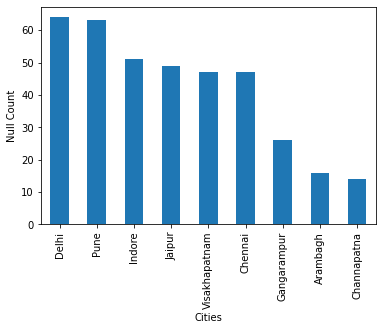

In [31]:
plt.figure()
null_state['city'].value_counts().plot.bar()
plt.ylabel("Null Count")
plt.xlabel("Cities")
plt.show()


In [32]:
state_null = event_data.dropna(subset=['state']).drop_duplicates('city').set_index('city')['state']
event_data['state']=event_data['state'].fillna(event_data['city'].map(state_null))
event_data.isnull().sum()

event_id       0
device_id    453
timestamp      0
longitude    423
latitude     423
city           0
state          0
dtype: int64

**Missing states have been filled with same city records** 

<a name = Section6.1.2></a>
### 6.1.2 Missing value treatment for Device ID

In [33]:
null_device_id.groupby(['state'])['city'].count()

state
AndhraPradesh    69
Delhi            69
Gujarat          32
MadhyaPradesh    51
Maharashtra      72
Punjab           16
Rajasthan        81
TamilNadu        63
Name: city, dtype: int64

In [34]:
df = null_device_id.groupby(['state','longitude','latitude'])['device_id'].count().reset_index()
df

,state,longitude,latitude,device_id
0,AndhraPradesh,83.34271,17.82291,0
1,AndhraPradesh,83.35799,17.80520,0
2,AndhraPradesh,83.37174,17.75282,0
3,Delhi,77.27481,28.72105,0
4,Delhi,77.29248,28.71997,0
5,Delhi,77.30315,28.72889,0
6,Gujarat,70.68639,21.79069,0
7,Gujarat,73.16934,21.19428,0
8,MadhyaPradesh,75.88296,22.81452,0
9,MadhyaPradesh,75.92333,22.77778,0


In [35]:
event_data[event_data['latitude'].isin(df['latitude'])].dropna(subset = ['device_id']).drop_duplicates(['latitude']).groupby(['longitude','latitude','device_id']).count()


,,,event_id,timestamp,city,state
longitude,latitude,device_id,,,,
70.68639,21.79069,-1688015122502424064.00000,1,1,1,1
73.16934,21.19428,-8215770519233685504.00000,1,1,1,1
73.86017,18.56693,8539870903150472192.00000,1,1,1,1
73.86276,18.62806,9027085705222633472.00000,1,1,1,1
73.92650,18.61481,177158571165078688.00000,1,1,1,1
75.83617,26.95399,3562355872640617984.00000,1,1,1,1
75.84601,26.96080,-8460337302442785792.00000,1,1,1,1
75.88296,22.81452,3132861355949762560.00000,1,1,1,1
75.88849,26.94869,-917725110041294336.00000,1,1,1,1


In [36]:
device_null = event_data.dropna(subset=['device_id']).drop_duplicates(['longitude']).set_index('longitude')['device_id']
device_null.head(20).sort_index()

longitude
72.84479    4928555839839670272.00000
73.87520    3978025911571213824.00000
77.22568    2973347786994914304.00000
77.24048    7566051280927281152.00000
77.25155   -3656132883647868928.00000
77.25681   -3264499652692492800.00000
77.26392    3020769016382465536.00000
77.28592   -3090166955280575488.00000
78.15540   -8879643774076165120.00000
80.29078   -3433061233631405568.00000
80.30687    7594215820567964672.00000
80.32739    3644267756307556352.00000
80.33543    7983871429718484992.00000
80.34361    5731369272434022400.00000
80.34461   -2168523477348251648.00000
80.35980    5536513450525271040.00000
83.38011    -601883305299256832.00000
83.39824    -512424213979236416.00000
85.99774     338888002570799936.00000
88.38836    4734221357723754496.00000
Name: device_id, dtype: float64

In [37]:
event_data[event_data['event_id']== 1936567]

,event_id,device_id,timestamp,longitude,latitude,city,state
2055,1936567,NaN,2016-05-02 15:27:54,75.88296,22.81452,Indore,MadhyaPradesh


In [38]:
event_data['device_id'] = event_data['device_id'].fillna(event_data['longitude'].map(device_null))
event_data.isnull().sum()

event_id       0
device_id      0
timestamp      0
longitude    423
latitude     423
city           0
state          0
dtype: int64

<a name = Section6.1.3></a>
### 6.1.3 Missing value treatment for Latitude and longitude

In [39]:
null_latitude.describe(include = 'all')

,event_id,device_id,timestamp,longitude,latitude,city,state
count,423.00000,423.00000,423,0.00000,0.00000,423,423
unique,NaN,NaN,422,NaN,NaN,9,8
top,NaN,NaN,2016-05-07 19:08:10,NaN,NaN,Jaipur,Rajasthan
freq,NaN,NaN,2,NaN,NaN,66,66
mean,1794087.98818,2824702047345898496.00000,NaN,NaN,NaN,NaN,NaN
std,935867.53820,4715207708880104448.00000,NaN,NaN,NaN,NaN,NaN
min,35313.00000,-8790560034584249344.00000,NaN,NaN,NaN,NaN,NaN
25%,945022.00000,1779631023439405312.00000,NaN,NaN,NaN,NaN,NaN
50%,2038959.00000,4580179444377397760.00000,NaN,NaN,NaN,NaN,NaN
75%,2560541.50000,5518659601894557696.00000,NaN,NaN,NaN,NaN,NaN


In [40]:
latitude_null = event_data.dropna(subset=['latitude']).drop_duplicates('device_id').set_index('device_id')['latitude']
latitude_null.head()

device_id
2973347786994914304.00000    28.73014
4734221357723754496.00000    22.66033
-3264499652692492800.00000   28.75791
5731369272434022400.00000    13.15333
338888002570799936.00000     23.84261
Name: latitude, dtype: float64

In [41]:
event_data['latitude'] = event_data['latitude'].fillna(event_data['device_id'].map(latitude_null))
event_data.isnull().sum()

event_id       0
device_id      0
timestamp      0
longitude    423
latitude       0
city           0
state          0
dtype: int64

In [42]:
longitude_null = event_data.dropna(subset=['longitude']).drop_duplicates('device_id').set_index('device_id')['longitude']

longitude_null.head()

device_id
2973347786994914304.00000    77.22568
4734221357723754496.00000    88.38836
-3264499652692492800.00000   77.25681
5731369272434022400.00000    80.34361
338888002570799936.00000     85.99774
Name: longitude, dtype: float64

In [43]:

event_data['longitude'] = event_data['longitude'].fillna(event_data['device_id'].map(longitude_null))
event_data.isnull().sum()


event_id     0
device_id    0
timestamp    0
longitude    0
latitude     0
city         0
state        0
dtype: int64

**There is no missing value in the event dataset.**

<a name = Section6.1.4></a>
### 6.1.4 Analyse Lattitude and Longitude information using Plotly and Folium Packages (Inappropriate Data Fix)

In [44]:
event_data.groupby(['longitude','latitude','state','city','device_id']).count()[:20]

event_id  \
longitude latitude state         city          device_id                              
12.56700  41.87190 Maharashtra   Pune          -3300282771940051456.00000         3   
12.56740  41.87190 AndhraPradesh Visakhapatnam 9078282559555458048.00000          3   
                   Bihar         Purnia        6171733141545328640.00000          3   
                   Delhi         Delhi         -1448078833416777984.00000         3   
                   MadhyaPradesh Indore        -2796107298017636352.00000         3   
                   Rajasthan     Jaipur        4718752803626400768.00000          3   
                   TamilNadu     Chennai       -170254198178616704.00000          3   
55.27080  25.20480 AndhraPradesh Visakhapatnam -8647958547458784256.00000         3   
                   Delhi         Delhi         2334568628287627776.00000          3   
                   Karnataka     Ilkal         -6903863101719990272.00000         3   
                   MadhyaPradesh Indore        889350735582174848.00000           3   
                   Maharashtra   Pune          436980604655174336.00000           3   
                   Rajasthan     Bari          -1926548054995953664.00000         3   
                   TamilNadu     Chennai       348551303690779904.00000           3   
69.20750  34.55530 AndhraPradesh Visakhapatnam -601883305299256832.00000          3   
                   Bihar         Masaurhi      -7165635156926407680.00000         3   
                   Delhi         Delhi         1057289835566390656.00000          3   
                   MadhyaPradesh Indore        8997995259821809664.00000          3   
                   Maharashtra   Pune          4995976326034236416.00000          3   
                   Rajasthan     Jaipur        -3693510914308259840.00000         3   

                                                                           timestamp  
longitude latitude state         city          device_id                              
12.56700  41.87190 Maharashtra   Pune          -3300282771940051456.00000          3  
12.56740  41.87190 AndhraPradesh Visakhapatnam 9078282559555458048.00000           3  
                   Bihar         Purnia        6171733141545328640.00000           3  
                   Delhi         Delhi         -1448078833416777984.00000          3  
                   MadhyaPradesh Indore        -2796107298017636352.00000          3  
                   Rajasthan     Jaipur        4718752803626400768.00000           3  
                   TamilNadu     Chennai       -170254198178616704.00000           3  
55.27080  25.20480 AndhraPradesh Visakhapatnam -8647958547458784256.00000          3  
                   Delhi         Delhi         2334568628287627776.00000           3  
                   Karnataka     Ilkal         -6903863101719990272.00000          3  
                   MadhyaPradesh Indore        889350735582174848.00000            3  
                   Maharashtra   Pune          436980604655174336.00000            3  
                   Rajasthan     Bari          -1926548054995953664.00000          3  
                   TamilNadu     Chennai       348551303690779904.00000            3  
69.20750  34.55530 AndhraPradesh Visakhapatnam -601883305299256832.00000           3  
                   Bihar         Masaurhi      -7165635156926407680.00000          3  
                   Delhi         Delhi         1057289835566390656.00000           3  
                   MadhyaPradesh Indore        8997995259821809664.00000           3  
                   Maharashtra   Pune          4995976326034236416.00000           3  
                   Rajasthan     Jaipur        -3693510914308259840.00000          3

**Observations**

- Some of the rows have same values of longitude and latitude for cities 'Visakhapatnam','Pune','Chennai','Delhi','Indore', 'Jaipur'. This seems to be inappropriate.
- As per our case study , we only need to analyze on 6 states 'TamilNadu','Manipur','Chandigarh', 'Tripura','UttarPradesh','ArunachalPradesh'.

- We will do further analysis on this 

In [45]:
event_data[(event_data['state'] == 'TamilNadu') & (event_data['latitude']>25)].sort_values(['latitude'])

,event_id,device_id,timestamp,longitude,latitude,city,state
533423,548055,348551303690779904.00000,2016-05-03 12:32:08,55.27080,25.20480,Chennai,TamilNadu
2393743,601176,348551303690779904.00000,2016-05-06 12:21:51,55.27080,25.20480,Chennai,TamilNadu
2847570,352256,348551303690779904.00000,2016-05-02 17:12:53,55.27080,25.20480,Chennai,TamilNadu
22269,2896853,7758074839281444864.00000,2016-05-02 05:48:31,69.20750,34.55530,Chennai,TamilNadu
1080564,3203806,7758074839281444864.00000,2016-05-01 21:16:33,69.20750,34.55530,Chennai,TamilNadu
2575568,3175643,7758074839281444864.00000,2016-05-01 05:13:10,69.20750,34.55530,Chennai,TamilNadu
91260,563738,-170254198178616704.00000,2016-05-02 01:05:02,12.56740,41.87190,Chennai,TamilNadu
245718,351833,-170254198178616704.00000,2016-05-04 16:26:38,12.56740,41.87190,Chennai,TamilNadu
291818,594503,-170254198178616704.00000,2016-05-06 06:17:27,12.56740,41.87190,Chennai,TamilNadu


In [46]:
# To check the lat & log points of our sates in neighbouring states ,
# added 'Delhi','AndhraPradesh','Pondicherry','MadhyaPradesh','Karnataka' to list 
target_states = ['TamilNadu','Manipur','Chandigarh','Tripura','UttarPradesh','ArunachalPradesh','Delhi','AndhraPradesh','Pondicherry','MadhyaPradesh','Kerala','Karnataka']
state_list = event_data.groupby(['longitude','latitude','city','state','device_id']).count().index.tolist()
event_data_index = pd.DataFrame(state_list,columns=['longitude','latitude','city','state','device_id'])
event_data_index = event_data_index[event_data_index.state.isin(target_states)]
event_data_index.head(10)

,longitude,latitude,city,state,device_id
1,12.56740,41.87190,Chennai,TamilNadu,-170254198178616704.00000
2,12.56740,41.87190,Delhi,Delhi,-1448078833416777984.00000
3,12.56740,41.87190,Indore,MadhyaPradesh,-2796107298017636352.00000
6,12.56740,41.87190,Visakhapatnam,AndhraPradesh,9078282559555458048.00000
8,55.27080,25.20480,Chennai,TamilNadu,348551303690779904.00000
9,55.27080,25.20480,Delhi,Delhi,2334568628287627776.00000
10,55.27080,25.20480,Ilkal,Karnataka,-6903863101719990272.00000
11,55.27080,25.20480,Indore,MadhyaPradesh,889350735582174848.00000
13,55.27080,25.20480,Visakhapatnam,AndhraPradesh,-8647958547458784256.00000
14,69.20750,34.55530,Chennai,TamilNadu,7758074839281444864.00000


In [47]:
event_data_index.groupby('state')['device_id'].count()

state
AndhraPradesh       4932
ArunachalPradesh      32
Chandigarh            35
Delhi               4912
Karnataka           6482
Kerala               939
MadhyaPradesh       3223
Manipur               30
Pondicherry           96
TamilNadu           5773
Tripura               36
UttarPradesh        3660
Name: device_id, dtype: int64

In [48]:
# state_arn_cha_tri for states ArunachalPradesh , Chandigarh and Tripura 
state_arn_cha_tri = event_data_index[event_data_index['state'].isin (['ArunachalPradesh','Chandigarh','Tripura'])]

# state_man_utt for states Manipur and UttarPradesh 
state_man_utt = event_data_index[event_data_index['state'].isin (['Manipur','UttarPradesh'])]

#state_TN for state TamilNadu
state_TN = event_data_index[event_data_index['state'].isin (['TamilNadu'])]

In [49]:
data = [go.Scattergeo(lat = state_arn_cha_tri['latitude'] , 
                      lon = state_arn_cha_tri['longitude'] ,
                      text = (state_arn_cha_tri['city'] + ',' + state_arn_cha_tri['state']),
                      name = '',
                    marker = dict(size =5 , autocolorscale = True , colorbar = dict(title ='City map')))]
layout = go.Layout(title=go.layout.Title(text='Data Points for ArunachalPradesh,Chandigarh and Tripura'), showlegend=True,
                   geo=go.layout.Geo(resolution=110, scope='asia', showframe=True, showcoastlines=True,
                                     landcolor="rgb(299, 299, 299)", countrycolor="black", coastlinecolor="black"))
fig = go.Figure(data=data, layout=layout)
fig.show() 

In [50]:
# import plotly.graph_objs as go
# data = [go.Scattergeo(lon=event_data_index[event_data_index.state.isin (['ArunachalPradesh','Chandigarh','Tripura'])]['longitude'], 
#                       lat =event_data_index[event_data_index.state.isin (['ArunachalPradesh','Chandigarh','Tripura'])]['latitude'], 
#                       text =(event_data_index[event_data_index.state.isin (['ArunachalPradesh','Chandigarh','Tripura'])]['city']+','+event_data_index[event_data_index.state.isin (['ArunachalPradesh','Chandigarh','Tripura'])]['state']), 
#                       name='',
#                       marker=dict(size=5,autocolorscale=True,colorbar=dict(title='City Map')))]

# layout = go.Layout(title=go.layout.Title(text='Data Points for ArunachalPradesh,Chandigarh and Tripura'), showlegend=True,
#                    geo=go.layout.Geo(resolution=110, scope='asia', showframe=True, showcoastlines=True,
#                                      landcolor="rgb(299, 299, 299)", countrycolor="black", coastlinecolor="black"))

# # In order to see the map please uncomment below 2 lines
# fig = go.Figure(data=data, layout=layout)
# fig.show()  

In [51]:
data = [go.Scattergeo(lon = state_man_utt['longitude'], 
                      lat = state_man_utt['latitude'], 
                      text =(state_man_utt['city']+','+ state_man_utt['state']), 
                      name='',
                      marker=dict(size=5,autocolorscale=True,colorbar=dict(title='City Map')))]

layout = go.Layout(title=go.layout.Title(text='Data Points for Manipur,UttarPradesh'), showlegend=True,
                   geo=go.layout.Geo(resolution=110, scope='asia', showframe=True, showcoastlines=True,
                                     landcolor="rgb(250, 250, 250)", countrycolor="black", coastlinecolor="black"))


fig = go.Figure(data=data, layout=layout)
fig.show() 

In [52]:
data = [go.Scattergeo(lon = state_TN['longitude'],
                     lat = state_TN['latitude'],
                      text = (state_TN['city']+'-'+ state_TN['state']),
                     name='',
                      marker = dict(size=5,autocolorscale = True , colorbar = dict(title ='city map')))]

layout = go.Layout(title = go.layout.Title(text ='Data points for TamilNadu'), showlegend = True,
                  geo =go.layout.Geo(resolution = 110 , scope = 'asia', showframe = True , showcoastlines = True,
                                    landcolor = 'rgb(229,229,229)',countrycolor = 'black', coastlinecolor = 'black'))

fig = go.Figure(data=data , layout = layout)
fig.show()

**TamilNadu and uttarpradesh have some outlier points**

Need to fix for Tamilnadu

In [53]:
# extracting TamilNadu state details for outliers in the longitude column
event_data_index[(event_data_index['state']== 'TamilNadu') & (event_data_index['longitude']<76)]

,longitude,latitude,city,state,device_id
1,12.56740,41.87190,Chennai,TamilNadu,-170254198178616704.00000
8,55.27080,25.20480,Chennai,TamilNadu,348551303690779904.00000
14,69.20750,34.55530,Chennai,TamilNadu,7758074839281444864.00000


**for above 3 device_id need to fix latitude and longitude**

In [54]:
event_data[(event_data['device_id']== -170254198178616704.00000) & (event_data['longitude']<76)]

,event_id,device_id,timestamp,longitude,latitude,city,state
91260,563738,-170254198178616704.00000,2016-05-02 01:05:02,12.56740,41.87190,Chennai,TamilNadu
245718,351833,-170254198178616704.00000,2016-05-04 16:26:38,12.56740,41.87190,Chennai,TamilNadu
291818,594503,-170254198178616704.00000,2016-05-06 06:17:27,12.56740,41.87190,Chennai,TamilNadu


In [55]:
event_data[event_data['device_id']== -170254198178616704.00000].head()

,event_id,device_id,timestamp,longitude,latitude,city,state
1506,2454547,-170254198178616704.00000,2016-05-06 14:03:49,80.30611,13.12890,Chennai,TamilNadu
2906,1392239,-170254198178616704.00000,2016-05-02 19:38:46,80.30611,13.12890,Chennai,TamilNadu
3483,1921243,-170254198178616704.00000,2016-05-06 03:37:49,80.30611,13.12890,Chennai,TamilNadu
3757,1135692,-170254198178616704.00000,2016-05-06 05:22:55,80.30611,13.12890,Chennai,TamilNadu
4206,1653864,-170254198178616704.00000,2016-05-05 18:06:06,80.30611,13.12890,Chennai,TamilNadu


In [56]:
'''For Latitude'''

event_data.loc[91260 ,'latitude'] = event_data.loc[1506,'latitude']
event_data.loc[245718,'latitude'] = event_data.loc[1506,'latitude']
event_data.loc[291818, 'latitude'] = event_data.loc[1506,'latitude']

'''For Longitude'''

event_data.loc[91260 ,'longitude'] = event_data.loc[1506,'longitude']
event_data.loc[245718,'longitude'] = event_data.loc[1506,'longitude']
event_data.loc[291818, 'longitude'] = event_data.loc[1506,'longitude']


In [57]:
event_data[(event_data['device_id']==-170254198178616704.00)].groupby(['longitude','latitude'])['city'].count()

longitude  latitude
80.30611   13.12890    2056
Name: city, dtype: int64

In [58]:
event_data[(event_data['device_id']== 348551303690779904.00000) & (event_data['longitude']<76)]

,event_id,device_id,timestamp,longitude,latitude,city,state
533423,548055,348551303690779904.00000,2016-05-03 12:32:08,55.27080,25.20480,Chennai,TamilNadu
2393743,601176,348551303690779904.00000,2016-05-06 12:21:51,55.27080,25.20480,Chennai,TamilNadu
2847570,352256,348551303690779904.00000,2016-05-02 17:12:53,55.27080,25.20480,Chennai,TamilNadu


In [59]:
event_data[(event_data['device_id']==348551303690779904.00000)].groupby(['longitude','latitude'])['city'].count()

longitude  latitude
55.27080   25.20480       3
80.35169   13.17215    2121
Name: city, dtype: int64

In [60]:
event_data[event_data['device_id']== 348551303690779904.00000].head()

,event_id,device_id,timestamp,longitude,latitude,city,state
996,2838836,348551303690779904.00000,2016-05-02 21:07:21,80.35169,13.17215,Chennai,TamilNadu
3923,187266,348551303690779904.00000,2016-05-01 21:50:27,80.35169,13.17215,Chennai,TamilNadu
5837,1892293,348551303690779904.00000,2016-05-07 10:52:51,80.35169,13.17215,Chennai,TamilNadu
6209,3129898,348551303690779904.00000,2016-05-05 02:33:27,80.35169,13.17215,Chennai,TamilNadu
7425,1699477,348551303690779904.00000,2016-05-04 22:30:16,80.35169,13.17215,Chennai,TamilNadu


In [61]:
'''For Latitude'''

event_data.loc[533423 ,'latitude'] = event_data.loc[996,'latitude']
event_data.loc[2393743,'latitude'] = event_data.loc[996,'latitude']
event_data.loc[2847570, 'latitude'] = event_data.loc[996,'latitude']

'''For Longitude'''

event_data.loc[533423 ,'longitude'] = event_data.loc[996,'longitude']
event_data.loc[2393743,'longitude'] = event_data.loc[996,'longitude']
event_data.loc[2847570, 'longitude'] = event_data.loc[996,'longitude']

In [62]:
event_data[(event_data['device_id']==348551303690779904.00000)].groupby(['longitude','latitude'])['city'].count()

longitude  latitude
80.35169   13.17215    2124
Name: city, dtype: int64

In [63]:
event_data[(event_data['device_id']== 7758074839281444864.00000) & (event_data['longitude']<76)]

,event_id,device_id,timestamp,longitude,latitude,city,state
22269,2896853,7758074839281444864.00000,2016-05-02 05:48:31,69.20750,34.55530,Chennai,TamilNadu
1080564,3203806,7758074839281444864.00000,2016-05-01 21:16:33,69.20750,34.55530,Chennai,TamilNadu
2575568,3175643,7758074839281444864.00000,2016-05-01 05:13:10,69.20750,34.55530,Chennai,TamilNadu


In [64]:
event_data[(event_data['device_id']==7758074839281444864.00000)].groupby(['longitude','latitude'])['city'].count()

longitude  latitude
69.20750   34.55530       3
80.34702   13.12868    1989
Name: city, dtype: int64

In [65]:
event_data[event_data['device_id']== 7758074839281444864.00000].head()

,event_id,device_id,timestamp,longitude,latitude,city,state
411,979138,7758074839281444864.00000,2016-05-02 06:28:23,80.34702,13.12868,Chennai,TamilNadu
2370,980741,7758074839281444864.00000,2016-05-01 08:02:33,80.34702,13.12868,Chennai,TamilNadu
2392,2387759,7758074839281444864.00000,2016-05-01 07:28:36,80.34702,13.12868,Chennai,TamilNadu
3049,3100330,7758074839281444864.00000,2016-05-05 05:14:43,80.34702,13.12868,Chennai,TamilNadu
3193,1739828,7758074839281444864.00000,2016-05-05 23:19:29,80.34702,13.12868,Chennai,TamilNadu


In [66]:
''' For Latitude '''

event_data.loc[22269 ,'latitude'] = event_data.loc[411,'latitude']
event_data.loc[1080564,'latitude'] = event_data.loc[411,'latitude']
event_data.loc[2575568, 'latitude'] = event_data.loc[411,'latitude']

''' for Longitude'''

event_data.loc[22269 ,'longitude'] = event_data.loc[411,'longitude']
event_data.loc[1080564,'longitude'] = event_data.loc[411,'longitude']
event_data.loc[2575568, 'longitude'] = event_data.loc[411,'longitude']

In [67]:
event_data[(event_data['device_id']==7758074839281444864.00000)].groupby(['longitude','latitude'])['city'].count()

longitude  latitude
80.34702   13.12868    1992
Name: city, dtype: int64

In [68]:
event_data[event_data.state=='TamilNadu'].groupby(['city','longitude','latitude'])['longitude','latitude'].nunique().head(10)

longitude  latitude
city    longitude latitude                     
Alandur 80.24832  13.06281          1         1
        80.24874  13.12458          1         1
        80.25221  13.06711          1         1
        80.25366  13.05260          1         1
        80.25404  13.06631          1         1
        80.25517  13.09077          1         1
        80.25619  13.09544          1         1
        80.25711  13.11789          1         1
        80.25888  13.05844          1         1
        80.26165  13.11113          1         1

In [69]:
event_data.loc[event_data['state'] == 'TamilNadu']['city'].value_counts()

Chennai               366875
Mayiladuthurai          1847
Salem                   1845
Gudiyattam              1543
Udagamandalam           1541
Kumbakonam              1488
Mettur                  1403
Dharapuram              1333
Idappadi                1240
Kuniyamuthur            1203
Avaniapuram             1156
Punamalli               1101
Paramakkudi             1092
Aruppukkottai           1086
Arakonam                1086
Vaniyambadi             1075
Pollachi                1055
Kavundampalaiyam        1051
Koyampattur             1045
Thuthukkudi             1024
Hosur                   1015
Rajapalaiyam            1009
Sankarankoil            1009
Pammal                   999
Neyveli                  996
Thanjavur                978
Virudunagar              962
Valparai                 959
Madhavaram               954
Thiruthangal             945
Tindivanam               940
Pudukkottai              931
Alandur                  895
Gopichettipalaiyam       895
Tiruvottiyur  

**Need to Fix latitude and longitude for UttarPradesh**

In [70]:
# extracting TamilNadu state details for outliers in the longitude column
event_data_index[(event_data_index['state']== 'UttarPradesh') & (event_data_index['longitude']<77)]

,longitude,latitude,city,state,device_id
1025,72.34528,23.37405,Kadi,UttarPradesh,7979510560032456704.00000
1026,72.34867,23.32038,Kadi,UttarPradesh,9062954710710413312.00000
1027,72.34927,23.32854,Kadi,UttarPradesh,2478951215603945984.00000
1028,72.35142,23.38097,Kadi,UttarPradesh,4427613529435560448.00000
1029,72.35625,23.39046,Kadi,UttarPradesh,-7126794995729813504.00000
1030,72.36527,23.37584,Kadi,UttarPradesh,535343017595963200.00000
1031,72.36759,23.38908,Kadi,UttarPradesh,-353874933250887424.00000
1032,72.36913,23.37952,Kadi,UttarPradesh,-5998464438928509952.00000
1033,72.38258,23.37758,Kadi,UttarPradesh,8551222022046229504.00000
1039,72.38858,23.34759,Kadi,UttarPradesh,-7281368521643485184.00000


In [71]:
event_data.loc[event_data['state'] == 'UttarPradesh']['city'].value_counts()

Varanasi             1633
Lakhnau              1629
Bisalpur             1558
Chandausi            1502
Tanda                1491
Agra                 1440
Aonla                1430
Shikohabad           1395
Sitapur              1381
Sherkot              1264
Lalitpur             1255
Bareli               1238
Pilibhit             1210
KanpurCantonment     1147
Modinagar            1132
Hathras              1099
Nagina               1098
Mainpuri             1079
Rath                 1078
Mirat                1069
Mirzapur             1063
Kanpur               1055
Moradabad            1054
Firozabad            1039
Khurja               1000
Gorakhpur             992
Khatauli              971
GangaGhat             969
Renukut               967
Auraiya               949
Kadi                  947
Mahoba                930
Banda                 930
Basti                 929
Saharanpur            926
Ujhani                925
Ghazipur              921
Allahabad             912
Hardoi      

**Kadi is not in uttarpradesh state , its belongs to Gujarat state . because of this in uttapradesh state outliers were present. Need to change to gujarat.**

In [72]:
event_data.loc[event_data[event_data['city']== 'Kadi'].index,['state']]='Gujurat'

In [73]:
event_data[event_data.city=='Kadi'].groupby(['state','city']).count()

,,event_id,device_id,timestamp,longitude,latitude
state,city,,,,,
Gujurat,Kadi,947,947,947,947,947


In [74]:
event_data['state'].value_counts()

Delhi                       751797
Maharashtra                 677168
TamilNadu                   436329
AndhraPradesh               321379
MadhyaPradesh               232741
Rajasthan                   196410
WestBengal                  196203
Karnataka                    99072
UttarPradesh                 93803
Gujarat                      42881
Bihar                        35472
Punjab                       26195
Kerala                       23148
Haryana                      21053
Jharkhand                    18060
Orissa                       15904
Telangana                    12784
Assam                        12021
Chhattisgarh                  9754
Uttaranchal                   7720
JammuandKashmir               5385
Goa                           3250
Nagaland                      2298
Pondicherry                   1741
Mizoram                       1613
Meghalaya                     1515
AndamanandNicobarIslands      1515
HimachalPradesh               1409
Manipur             

**Checking target states data points in other near by states using plotly** 

In [75]:
data = [go.Scattergeo(lon = event_data_index[event_data_index.state.isin(['Delhi','AndhraPradesh','Pondicherry'])]['longitude'],
                     lat = event_data_index[event_data_index.state.isin(['Delhi','AndhraPradesh','Pondicherry'])]['latitude'],
                      text = (event_data_index[event_data_index.state.isin(['Delhi','AndhraPradesh','Pondicherry'])]['city']+'-'+event_data_index[event_data_index.state.isin(['Delhi','AndhraPradesh','Pondicherry'])]['state']),
                     name='',
                      marker = dict(size=5,autocolorscale = True , colorbar = dict(title ='city map')))]

layout = go.Layout(title = go.layout.Title(text ='Data points for Delhi,AndhraPradesh,Pondicherry'), showlegend = True,
                  geo =go.layout.Geo(resolution = 110 , scope = 'asia', showframe = True , showcoastlines = True,
                                    landcolor = 'rgb(229,229,229)',countrycolor = 'black', coastlinecolor = 'black'))

fig = go.Figure(data=data , layout = layout)
fig.show()

In [76]:
data = [go.Scattergeo(lon = event_data_index[event_data_index.state.isin(['MadhyaPradesh','Kerala','Karnataka'])]['longitude'],
                     lat = event_data_index[event_data_index.state.isin(['MadhyaPradesh','Kerala','Karnataka'])]['latitude'],
                      text = (event_data_index[event_data_index.state.isin(['MadhyaPradesh','Kerala','Karnataka'])]['city']+'-'+event_data_index[event_data_index.state.isin(['MadhyaPradesh','Kerala','Karnataka'])]['state']),
                     name='',
                      marker = dict(size=5,autocolorscale = True , colorbar = dict(title ='city map')))]

layout = go.Layout(title = go.layout.Title(text ='Data points for MadhyaPradesh,Kerala & Karnataka'), showlegend = True,
                  geo =go.layout.Geo(resolution = 110 , scope = 'asia', showframe = True , showcoastlines = True,
                                    landcolor = 'rgb(229,229,229)',countrycolor = 'black', coastlinecolor = 'black'))

fig = go.Figure(data=data , layout = layout)
fig.show()

**From above plot we learnt that there is no data points related to target states . There are outliers in delhi and madhyapradesh states but as we are focusing more on target states , these outliers can be neglected.**

**Checking Descripancy using folium package**

In [77]:
# # As map size is more and it may intrupt the notebook , so have saved the map as html. 
# event_map = event_data_index[event_data_index.latitude.isnull()==False][["latitude", "longitude", "city"]]
# map = folium.Map(location=[event_map.latitude.mean(), event_map.longitude.mean()], zoom_start=4, control_scale=True)
# for index, location_info in event_map.iterrows():
#     folium.Marker([location_info["latitude"], location_info["longitude"]], popup=location_info["city"]).add_to(map)
# #display(map)
# map.save('state_folium.html')

**No descripancy found in map regarding latitude and longitude of target states**

<a name = Section6.2></a>
### 6.2 Converting Chinese to English transalation for device model

In [78]:
# Importing re : functions in this module let you check if a particular string matches a given regular expression 
# Finding the unique chinese words in the device_model data using "re" library

import re
def device_mod_chin(model_chin): 
    for x in model_chin: 
        if re.search("[\u4e00-\u9FFF]", x):
            device_model.append(x)
    return device_model

device_model = []
device_model = device_mod_chin(phone_model.device_model)
device_model = set(device_model)
print(device_model)

{'大观铂顿', '青春版', '超级手机Max', '小辣椒 6', '乐檬K3 Note', '黄金斗士青春版', '红辣椒NX Plus', '超级手机1 Pro', '魅蓝NOTE', '魅蓝metal', '小苹果', '天鉴W808', '大神F2全高清版', '荣耀6 plus', '黄金斗士Note8', 'ivvi 小骨Pro', 'My 布拉格', 'ivvi 小i', '红米2', '大神Note', '春雷HD', 'metal 标准版', '微客', '小辣椒 5', '金钢', '大Q Note', '小辣椒 9', '荣耀畅玩4', '大神Note3', '麦芒3S', '红辣椒Note', '青漾3', '魅蓝Note3', '大神1s', '红辣椒Note3', '荣耀4A', '小辣椒 M2', '荣耀+', '红米Note2', '醉享', '魔镜 X5', '麦芒4', '红米note增强版', '大神F2', '小辣椒X4', '大神X7', '红米1S', '天鉴W900', '灵感XL', '荣耀畅玩4C', '黄金斗士S8畅玩版', '锋尚2', '小辣椒 3', '三星big foot', '威武3C', '红辣椒', '小辣椒 4', '荣耀畅玩4C运动版', '畅享5', '时尚手机', '红牛V5', '纽扣', '联想VIBE X2', '2016版 Galaxy A7', '炫影S+', '渴望HD', '红米', '荣耀7i', '旗舰版', '飞马3', '金刚II', 'Axon天机', 'TALK 7X四核', 'Z9 mini 精英版', '领世旗舰3', '畅享5S', '小辣椒 M3', '飞马2 Plus', '小辣椒 7', 'Xperia Z1 炫彩版', '荣耀畅玩平板T1', '倾城L3', '魅蓝', '乐檬K3', '小章鱼', '超级手机1', '荣耀3C畅玩版', '联想黄金斗士S8', '野火S', '黄金斗士A8', '么么哒', 'Razr V锋芒', '乐玩2C', '红米note', '荣耀畅玩5', '红米2A', '远航3', '锋尚Max', '锋尚', '7295A青春版', '天鉴W900S', '2016版 Galaxy J7', '小米note', '

In [79]:
# !pip3 uninstall googletrans
# !pip3 install googletrans==3.1.0a0

In [80]:
# from googletrans import Translator

In [81]:
# phonedata2 = iter(phone_model['phone_brand'].unique())
# translator= Translator()

# for var in phonedata2:
#     try:
#         translation = translator.translate(var, src='zh-cn', dest='en').text
#         phone_model.phone_brand= phone_model.phone_brand.replace(var,translation)
#     except:
#         print("Error to translate: ", var)

# phone_model.head()

In [82]:
# Creating dictionary of chinese to english device models
device_chinese = ['乐檬3', '飞马3', 'ivvi 小i', '2016版 Galaxy A5', 'Z9 mini 精英版', '金刚II', '小辣椒 9', 
                     '锋尚2', 'Xperia Z1 炫彩版', '天鉴W900', '小鲜3', '大观铂顿', '威武3', '荣耀U8860', '联想VIBE X2', 
                     '青漾3', '红辣椒XM', '小辣椒 6', '小辣椒 4', '小辣椒 7', 'metal 标准版', 'My 布拉格', '大神Note', 
                     '红米3', '荣耀畅玩4C', '金钢', '超级手机1', '三星big foot', '黄金斗士Note8', 'note顶配版', '飞马2 Plus', 
                     '小鲜2', '大神F2', '么么哒3N', '红米2', '大神1s', '红辣椒NX Plus', '天鉴W900S', '大神F2全高清版', 
                     '星星1号', '乐檬K31', '荣耀7i', 'Razr V锋芒', '黄金斗士S8畅玩版', 'ivvi 小骨Pro', '小章鱼', '么么哒3S', 
                     '锋尚Max', '小辣椒 5', '荣耀6 Plus', '坚果手机', '2016版 Galaxy A7', '黄金斗士A8', '魅蓝NOTE', 
                     'TALK 7X四核', '小辣椒X4', '荣耀X2', '联想黄金斗士S8', '大Q Note', '荣耀平板T1-823L', '乐玩', '乐檬X3', 
                     '荣耀6 plus', '魅蓝', '畅享5', '火星一号', '魅蓝metal', '乐檬K3', '荣耀6', '雷霆战机', '荣耀3C畅玩版', 
                     '荣耀7', '魔镜 X5', '小辣椒 M2', '大观4', '微客', '荣耀4A', '领世旗舰3', '2016版 Galaxy A9', 
                     '黄金斗士青春版', '荣耀畅玩5X', '青春版', '春雷HD', '远航3', '7295A青春版', '时尚手机', '乐檬K3 Note', 
                     '倾城L3C', '小苹果', '荣耀+', 'Axon天机', '荣耀3X畅玩版', '红米Note2', '红米', '红辣椒 X1', '大神F1Plus', 
                     '红米note', '麦芒3', '锋尚Pro', '炫影S+', '醉享', '荣耀畅玩4X', '红米note增强版', '渴望HD', '倾城L3', 
                     '灵感XL', '畅享5S', '威武3C', '天鉴W808', '荣耀畅玩4C运动版', '小辣椒S1', 'Moto X极', '红米Note3', 
                     '超级手机1 Pro', '小星星', '大器3', '魅蓝Note 2', '锋尚', '乐玩2C', '小辣椒 X3', '旋影90w', '荣耀畅玩4', 
                     '魅蓝2', '旗舰版', '荣耀畅玩5', 'Mate 7 青春版', '火星一号探索版', '天鉴T1', '红牛V5', '荣耀畅玩平板T1', 
                     '红辣椒', '大器2', '风华3', '土星一号', '魅蓝Note3', '荣耀3X', '红辣椒Note3', '大神Note3', '麦芒3S', 
                     '红米1S', '麦芒4', '大神X7', '小米note', '飞马', '红辣椒任性版 Plus', '小辣椒 M3', '么么哒', '小辣椒 3', 
                     'T03锋至版', '星星2号', '大神F1', '红米2A', '小米4C', '纽扣', '红辣椒Note', '野火S', '中兴远航3', 
                     '超级手机1s', '超级手机Max', '2016版 Galaxy J7', '荣耀3C']
device_english = ['Le Meng 3','Pegasus 3','ivvi Little i', '2016 version of Galaxy A5','Z9 mini Elite','Vajra II',
                     'Little Pepper 9','Feng Shang 2', ' Xperia Z1 Colorful Edition','Tianjian W900','Xiao Xian 3',
                     'Grand View Platinum','Mighty 3','Honor U8860','Lenovo VIBE X2','Blue 3','Red Pepper XM',
                     'Little Pepper 6','Little Pepper 4','Little Pepper 7','Metal Standard','My Prague','Great God Note',
                     'Redmi 3','Honor Play 4C', 'Jin Gang','Super Phone 1','Samsung big foot','Golden Fighter Note8',
                     'note top version','Pegasus 2 Plus','Xiao Xian 2','Great God F2', ' Me Da 3N','Redmi 2',
                     'Great God 1s','Red Pepper NX Plus','Tianjian W900S','Great God F2 Full HD Version','Star 1',
                     'Le Lemon K31', ' Glory 7i','Razr V Fengmang','Golden Fighter S8 Play Edition','ivvi Little Bone Pro',
                     'Little Octopus','Mo Mo Da 3S','Feng Shang Max','Little Pepper 5', ' Honor 6 Plus','Nuts Phone', 
                     '2016 Galaxy A7','Golden Fighter A8','Charm Blue NOTE','TALK 7X Quad Core','Little Pepper X4',
                     'Honor X2','Lenovo Gold Gladiator S8','Big Q Note','Honor Tablet T1-823L','Lewan','Lemon X3',
                     'Honor 6 plus','Charm Blue','Enjoy 5','Mars One ','Charm Blue Metal','Le Meng K3','Honor 6',
                     'Thunder Fighter','Honor 3C Play Edition','Honor 7','Magic Mirror X5','Little Pepper M2', 
                     'Daguan 4','Weike','Glory 4A','Leadership Flagship 3', '2016 Galaxy A9','Golden Fighter Youth Edition',
                     'Honor Play 5X','Youth Edition','Spring Lei HD','Yuanhang 3', '7295A Youth Edition','Fashion Phone',
                     'Le Meng K3 Note','Qingcheng L3C','Little Apple','Glory+','Axon Sky Machine',
                     'Glory 3X Chang Play Edition','Redmi Note2','Redmi','Red Pepper X1','Great God F1Plus',
                     'Redmi Note','Mai Mang 3','Feng Shang Pro','Hyun Shadow S+', ' Drunken Enjoy','Honor Play 4X',
                     'Redmi Note Enhanced Edition','Longing HD','Allure L3','Inspiration XL','Enjoy 5S','Powerful 3C',
                     'Tianjian W808' ,'Honor Play 4C Sports Edition','Little Pepper S1','Moto X Pole','Redmi Note3',
                     'Super Phone 1 Pro','Little Star','Big 3','Charm Blue Note 2','Feng Shang','Lewan 2C',
                     'Little Pepper X3','Xuanying 90w','Honor Play 4','Charm Blue 2','Flagship','Honor Play 5' ,
                     'Mate 7 Youth Edition','Mars One Exploration Edition','Tianjian T1','Red Bull V5','Honor Play T1',
                     'Red Chili','Big 2','Fenghua 3' ,'Saturn One','Charm Blue Note3','Glory 3X','Red Chili Note3',
                     'Great God Note3','Maimang 3S','Redmi 1S','Maimang 4','Great God X7', 'Xiaomi Note','Pegasus',
                     'Red Pepper Capricious Edition Plus','Little Pepper M3','Mo Mo Da','Little Pepper 3',
                     'T03 Fengzhi Edition','Xingxing 2', ' Great God F1','Redmi 2A','Xiaomi 4C','Button',
                     'Red Chili Note','Wildfire S','ZTE Voyage 3','Super Phone 1s','Super Phone Max', 
                     '2016 Edition Galaxy J7','Honor 3C']

device = dict(zip(device_chinese, device_english))
phone_model['device_model'].value_counts().head(20)

红米note           3500
MI 3             2739
MI 2S            2547
Galaxy Note 3    2378
MI 4             2256
Galaxy S4        1910
Galaxy Note 2    1877
荣耀6              1471
荣耀畅玩4X           1279
荣耀3C             1206
红米1S             1191
红米               1168
Galaxy S3        1156
Mate 7           1125
魅蓝NOTE           1026
红米2               941
红米Note2           903
MX3               842
Galaxy S5         827
荣耀6 Plus          815
Name: device_model, dtype: int64

In [83]:
phone_model['device_model'] = phone_model['device_model'].apply(lambda x: device[x] if x in device else x)

In [84]:
phone_model['device_model'].value_counts().head(10)

Redmi Note       3500
MI 3             2739
MI 2S            2547
Galaxy Note 3    2378
MI 4             2256
Galaxy S4        1910
Galaxy Note 2    1877
Honor 6          1471
Honor Play 4X    1279
Honor 3C         1206
Name: device_model, dtype: int64

<a name = Section6.3></a>
### 6.3 Converting chinese to English translation for Phone Brand

In [85]:
phone_model['phone_brand'].unique()

array(['vivo', '小米', 'OPPO', '三星', '酷派', '联想 ', '华为', '奇酷', '魅族', '斐讯',
       '中国移动', 'HTC', '天语', '至尊宝', 'LG', '欧博信', '优米', 'ZUK', '努比亚', '惠普',
       '尼比鲁', '美图', '乡米', '摩托罗拉', '梦米', '锤子', '富可视', '乐视', '海信', '百立丰',
       '一加', '语信', '海尔', '酷比', '纽曼', '波导', '朵唯', '聆韵', 'TCL', '酷珀', '爱派尔',
       'LOGO', '青葱', '果米', '华硕', '昂达', '艾优尼', '康佳', '优购', '邦华', '赛博宇华',
       '黑米', 'Lovme', '先锋', 'E派', '神舟', '诺基亚', '普耐尔', '糖葫芦', '亿通', '欧新',
       '米奇', '酷比魔方', '蓝魔', '小杨树', '贝尔丰', '糯米', '米歌', 'E人E本', '西米', '大Q',
       '台电', '飞利浦', '唯米', '大显', '长虹', '维图', '青橙', '本为', '虾米', '夏新', '帷幄',
       '百加', 'SUGAR', '欧奇', '世纪星', '智镁', '欧比', '基伍', '飞秒', '德赛', '易派',
       '谷歌', '金星数码', '广信', '诺亚信', 'MIL', '白米', '大可乐', '宝捷讯', '优语', '首云',
       '瑞米', '瑞高', '沃普丰', '摩乐', '鲜米', '凯利通', '唯比', '欧沃', '丰米', '恒宇丰',
       '奥克斯', '西门子', '欧乐迪', 'PPTV'], dtype=object)

In [86]:
brands_chinese = ['vivo', '小米', 'OPPO', '三星', '酷派', '联想 ', '华为', '奇酷', '魅族', '斐讯',
       '中国移动', 'HTC', '天语', '至尊宝', 'LG', '欧博信', '优米', 'ZUK', '努比亚', '惠普',
       '尼比鲁', '美图', '乡米', '摩托罗拉', '梦米', '锤子', '富可视', '乐视', '海信', '百立丰',
       '一加', '语信', '海尔', '酷比', '纽曼', '波导', '朵唯', '聆韵', 'TCL', '酷珀', '爱派尔',
       'LOGO', '青葱', '果米', '华硕', '昂达', '艾优尼', '康佳', '优购', '邦华', '赛博宇华',
       '黑米', 'Lovme', '先锋', 'E派', '神舟', '诺基亚', '普耐尔', '糖葫芦', '亿通', '欧新',
       '米奇', '酷比魔方', '蓝魔', '小杨树', '贝尔丰', '糯米', '米歌', 'E人E本', '西米', '大Q',
       '台电', '飞利浦', '唯米', '大显', '长虹', '维图', '青橙', '本为', '虾米', '夏新', '帷幄',
       '百加', 'SUGAR', '欧奇', '世纪星', '智镁', '欧比', '基伍', '飞秒', '德赛', '易派',
       '谷歌', '金星数码', '广信', '诺亚信', 'MIL', '白米', '大可乐', '宝捷讯', '优语', '首云',
       '瑞米', '瑞高', '沃普丰', '摩乐', '鲜米', '凯利通', '唯比', '欧沃', '丰米', '恒宇丰',
       '奥克斯', '西门子', '欧乐迪', 'PPTV']
brands_english = ['vivo','Xiaomi','OPPO','Samsung','Cool','Lenovo','Huawei','Qiku','Meizu','Fixuns',
'China Mobile','HTC','Tianyu','Supreme Treasure','LG','Obson','Umi','ZUK','Nubia','HP',
'Nibiru','Meitu','Xianmi','Motorola','Mengmi','Hammer','Focus','LeTV','Hisense','Baifeng', 
'One Plus','Letter','Haier','Coolby','Newman','Wave','Duowei','Listening Rhyme','TCL','Cupper','Aipal ',
'LOGO','Green Onion','Guomi','ASUS','Onda','Ai Youni','Konka','Yougo','Banghua','Saibo Yuhua',
'Black Rice','Lovme','Pioneer','E Pie','Shenzhou','Nokia','Pnell','Candied Gourd','Yitong','Osin',
'Mickey','Rubiks Cube','Blue Devil','Little Poplar','Belfong','Glutinous Rice','Mige','Eren Eben','Simi','Big Q' ,'Taipower','Philips','Wei Mi','Da Xian','Changhong','Weitu','Green Orange','Original','Shrimp','Xia Xin','Xiao','Baiga','SUGAR','Ouqi','Century Star','Chi Magnesium','Obi','Kivu','Femtosecond','Desai','Epai',
'Google','Venus Digital','Guangxin','Noah','MIL','Bai Mi','Big Cola','Bao Jie Xun','Youyu','Shouyun',
'Rumi','Rigao','Wopfung','Mole','Fresh Rice','Kellystone','Vibe','Ovo','Fungmi','Hengyufeng ',
'Aux','Siemens','Oledi','PPTV']

brand = dict(zip(brands_chinese,brands_english))

In [87]:
phone_model['phone_brand'] = phone_model['phone_brand'].apply(lambda x: brand[x] if x in brand else x)
phone_model['phone_brand'].value_counts().head()

Xiaomi     21645
Samsung    19211
Huawei     15181
vivo        7596
OPPO        6717
Name: phone_brand, dtype: int64

<a name = Section6.4></a>
### 6.4 Fixing outlier in Age column

In [88]:
gender_age_train.describe()

,device_id,age
count,74645.00000,74645.00000
mean,-749135388419837.00000,31.41034
std,5327149733911456768.00000,9.86873
min,-9223067244542181376.00000,1.00000
25%,-4617366812584264704.00000,25.00000
50%,-18413620249632024.00000,29.00000
75%,4636655899093149696.00000,36.00000
max,9222849349208140800.00000,96.00000


<AxesSubplot:>

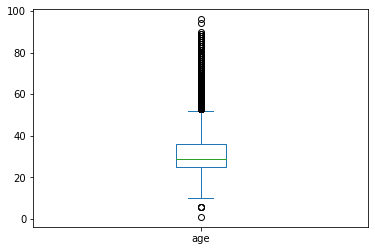

In [89]:
gender_age_train['age'].plot(kind='box')

**From above box plot we can see there are outliers in age column. 1,6,94 and 96 years are outliers . we need to fix this by mapping the corresponding values in age column with index of respecting age / gender / group**

In [90]:
gender_age_train.loc[(gender_age_train['age']>= 91)]

,device_id,gender,age,group
5958,-7047596037344697961,F,96,F43+
60872,1177477789654193646,F,94,F43+


In [91]:
age_6 =gender_age_train.loc[(gender_age_train['age'] <= 6)]
age_6

,device_id,gender,age,group
10385,3553057874282315257,M,1,M22-
60779,-8513863533705424532,M,6,M22-
60831,-5323874218045578676,M,6,M22-
60832,3646841514566479686,M,6,M22-
60833,5222152119137955379,M,6,M22-


In [92]:
age_6.groupby(['group'])['age','device_id','gender'].nunique()

,age,device_id,gender
group,,,
M22-,2,5,1


In [93]:
# import plotly.offline as pyoff
# plot_data = [
#     go.Box(
#         x=gender_age_train['age'],fillcolor='rgba(219, 64, 82, 0.6)',)]

# plot_layout = go.Layout(
#         title='Age')
# fig = go.Figure(data=plot_data, layout=plot_layout)
# pyoff.iplot(fig)

In [94]:
gender_age_train[(gender_age_train['age'] == 6) | ((gender_age_train['age'] == 88) & (gender_age_train['group'] == 'F43+'))]

,device_id,gender,age,group
3065,-5773450219741882297,F,88,F43+
3068,-8881071865742467804,F,88,F43+
3560,-4648373198049034564,F,88,F43+
60779,-8513863533705424532,M,6,M22-
60831,-5323874218045578676,M,6,M22-
60832,3646841514566479686,M,6,M22-
60833,5222152119137955379,M,6,M22-


In [95]:
# mapping the index for age 1, 6 with age of 10 of male in M22- group 
gender_age_train.loc[10385 ,'age'] = gender_age_train.loc[15107,'age']
gender_age_train.loc[60779,'age'] = gender_age_train.loc[15107,'age']
gender_age_train.loc[60831 ,'age'] = gender_age_train.loc[15107,'age']
gender_age_train.loc[60832 ,'age'] = gender_age_train.loc[15107,'age']
gender_age_train.loc[60833 ,'age'] = gender_age_train.loc[15107,'age']

# mapping the index for the age 94 & 96  with age 88 of female in F43+ group 
gender_age_train.loc[5958 ,'age'] = gender_age_train.loc[3065,'age']
gender_age_train.loc[60872 ,'age'] = gender_age_train.loc[3065,'age']



In [96]:
gender_age_train.loc[(gender_age_train['age'] <= 6) | (gender_age_train['age'] >=91)]

,device_id,gender,age,group


In [97]:
print('Min age is : ',gender_age_train['age'].min())
print('Max age is : ', gender_age_train['age'].max())

Min age is :  10
Max age is :  90


**No outliers in age column now**

<a name = Section6.5></a>
### 6.5 Extracting Data for target states from the Event Data For EDA 


In [98]:
# Selecting target states for analysis 
event_data_new= event_data.loc[event_data['state'].isin(['TamilNadu', 'Manipur','Chandigarh', 'Tripura', 'UttarPradesh','ArunachalPradesh'])]
event_data_new.shape

(533515, 7)

In [99]:
event_data_new.isnull().sum()

event_id     0
device_id    0
timestamp    0
longitude    0
latitude     0
city         0
state        0
dtype: int64

In [100]:
#Converting Device_Id column of gender_age_tarin and phone_model dataset to float for smooth merging with event_data.
gender_age_train['device_id'] = gender_age_train['device_id'].astype('float')
phone_model['device_id'] = phone_model['device_id'].astype('float')

In [101]:
# Converting timestamp dtype to datetime from objrct
event_data_new['timestamp'] = pd.to_datetime(event_data_new['timestamp'])
event_data_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 533515 entries, 3 to 3252949
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   event_id   533515 non-null  int64         
 1   device_id  533515 non-null  float64       
 2   timestamp  533515 non-null  datetime64[ns]
 3   longitude  533515 non-null  float64       
 4   latitude   533515 non-null  float64       
 5   city       533515 non-null  object        
 6   state      533515 non-null  object        
dtypes: datetime64[ns](1), float64(3), int64(1), object(2)
memory usage: 32.6+ MB


**Final Observations after cleaning Data**

1. Replaced **missing values** present in **State** column of **event_data** with corresponding city value for missing states.


2. Replaced **missing values** present in **device_id** columns of **event_data** with the help of corresponding **latitude** value to populate the missing **device_id**. 


3. Replaced **missing values** present in **longitude and latitude** columns of **event_data** with the help of corresponding **device_id**. 


4.  There were some discrepancy in latitude abnd longitude in event_data for target states('TamilNadu','Manipur','Chandigarh','Tripura','UttarPradesh', 'ArunachalPradesh') . Found these discripancy with the help of plotly and folium libraries.Fixed the outliers in lat and long of TamilNadu and UttarPradesh with help of same device_id.


5. For TamilNadu we found that 9 rows have incorrect lat & long data, we have replaced with correct longitude and latitude for the same device_id.


6. For UttarPradesh we found that one of the city named 'Kadi' has inccorect state . Actually it is part of Gujarat state but in event data its mentioned as UttarPradesh. This has been fixed with updating 947 rows of Kadi city to Gujarat state from UttarPradesh state.


7. Translated **Chinese** name present in **phone_brand** and **device_model** of phone_model dataset with equivalent English name with help of maping . 


8. There were **outliers** present in age column- **1,6,94 and 96 years** . we replaced these values by mapping the index of corresponding values in age column.Fixed minimun to 10 years and maximum age to 89 years .


9. Converted the **dtype** of device_id in **gender_age_train and phone_model** dataset from INT to FLOAT.


10. Converted the **dtype** of **timestamp** column to Datetime from object.


11. Filtered the states based on target states **(TamilNadu','Manipur','Chandigarh','Tripura','UttarPradesh','ArunachalPradesh').**




<a name = Section6.6></a>
###  6.6 Merging of all Datasets For EDA 

In [102]:
# Merging all the three data in to one final data for EDA 
# Merging datasets on device_id ( default as inner join : to get all the information of user 
# on the event loged on the device id . 

data =event_data_new.merge(phone_model,on='device_id')
telecom_data = data.merge(gender_age_train,on='device_id')
telecom_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 533515 entries, 0 to 533514
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   event_id      533515 non-null  int64         
 1   device_id     533515 non-null  float64       
 2   timestamp     533515 non-null  datetime64[ns]
 3   longitude     533515 non-null  float64       
 4   latitude      533515 non-null  float64       
 5   city          533515 non-null  object        
 6   state         533515 non-null  object        
 7   phone_brand   533515 non-null  object        
 8   device_model  533515 non-null  object        
 9   gender        533515 non-null  object        
 10  age           533515 non-null  int64         
 11  group         533515 non-null  object        
dtypes: datetime64[ns](1), float64(3), int64(2), object(6)
memory usage: 52.9+ MB


<a name = Section7></a>
### 7. Data Post-Profiling

In [103]:
# profile = ProfileReport(df = telecom_data)
# profile.to_file(output_file = 'Post Profiling Report-telecom data.html')
# print('Accomplished!')

**Observations**

- There are **12 variables** with **533515** observations.
- There are **5 numeric ,1 datetime and 6 categorical** variables.
- No **missing values** present in data.
- Data has **201** different **cities** out of which maximum users are found in **Chennai (68.8%).**
- Data has **6** different states out of which maximum users are from **TamilNadu (81.8%).**
- **Phone_Brand** contains **81** different brand information out of which **Xiaomi(32.6%)** is preferred by most users followed by **Samsung, Huawei, vivo ,Meizu and then OPPO**
- **Male** mobile users are **more** compared to **Female** users **(67.6% Male users and 32% Female users)**
- **Age** column is **right-skewed** with minimum value of 10 and maximum value of 89
- **device_model** has a **high cardinality: 897 distinct values**	
- **state** is **highly correlated** with **longitude and longitude.**
- **phone_brand** is **highly correlated** with **device_id ,age and group.**
- Maximum users for this network are **Male** which are aged between **32 to 38**. Female users are not preferring this network much compare to male users.
- **event_id** has **unique** values means **no duplicate rows**

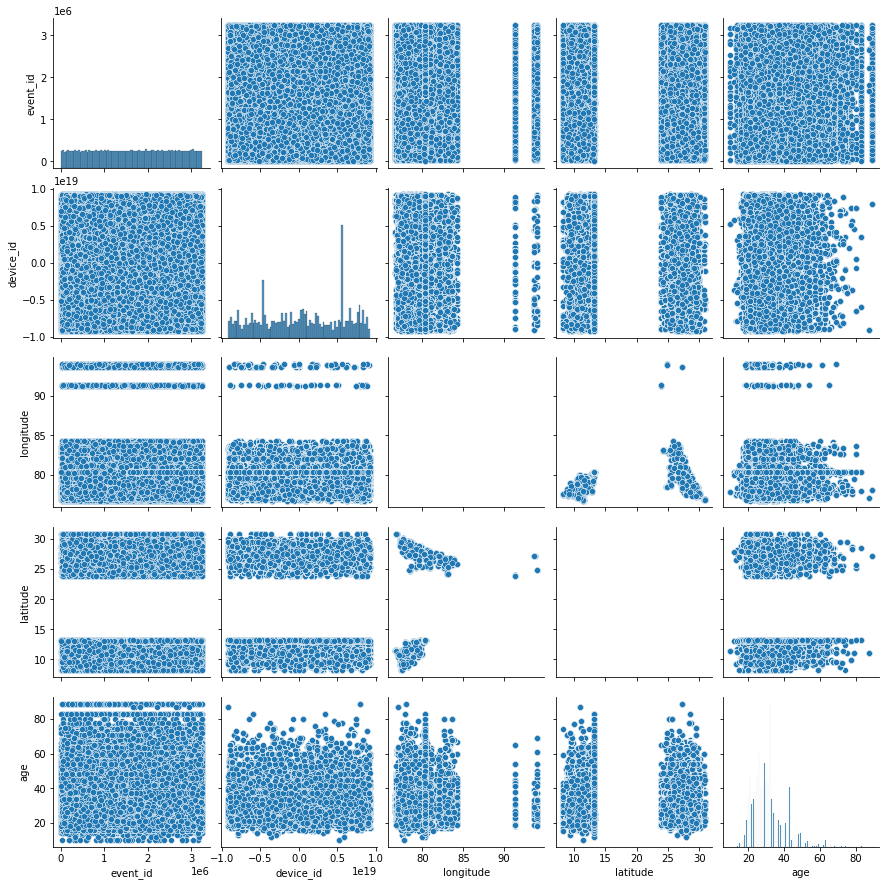

In [104]:
sns.pairplot(telecom_data)

<AxesSubplot:>

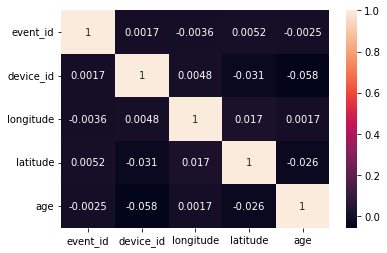

In [105]:
sns.heatmap(telecom_data.corr(), annot = True)

<a name = Section8></a>
### 8. Exploratory Data Analysis on Final Data

<a name = SectionQ1></a>
### Q1. Distribution of Users(device_id) across States

In [106]:
device = telecom_data.groupby(['state'])['device_id'].nunique().sort_values(ascending = False)
device.head(10)

state
TamilNadu           5770
UttarPradesh        3635
Tripura               36
Chandigarh            35
ArunachalPradesh      32
Manipur               30
Name: device_id, dtype: int64

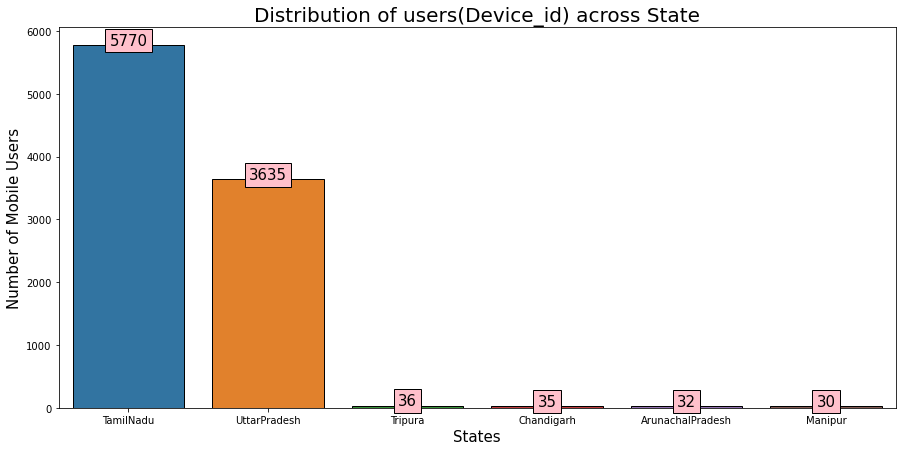

In [107]:
fig = plt.figure(figsize = [15,7])

x = device.index
y = device.values

def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i,y[i],y[i],fontsize = 15 ,horizontalalignment = 'center', color = 'black' ,Bbox = dict(facecolor = 'pink', alpha = 1))

sns.barplot(x,y, edgecolor='black')

addlabels(x,y)

plt.ylabel("Number of Mobile Users",fontsize=15)
plt.xlabel("States",fontsize=15)
plt.title("Distribution of users(Device_id) across State",fontsize=20)
plt.show()

**We can see from above plot that , more users are from Tamilnadu(around 61%) and Uttarpradesh (around 38%).**

<a name = SectionQ2></a>
### Q2. Distribution of users across phone brands (Top 10 phone brands )

In [108]:
ph_brand = telecom_data.groupby(['phone_brand'])['device_id'].nunique().sort_values(ascending=False)[:10]
ph_brand

phone_brand
Xiaomi     2405
Samsung    2133
Huawei     1502
vivo        881
OPPO        686
Meizu       589
Cool        473
HTC         148
Lenovo      111
LeTV         84
Name: device_id, dtype: int64

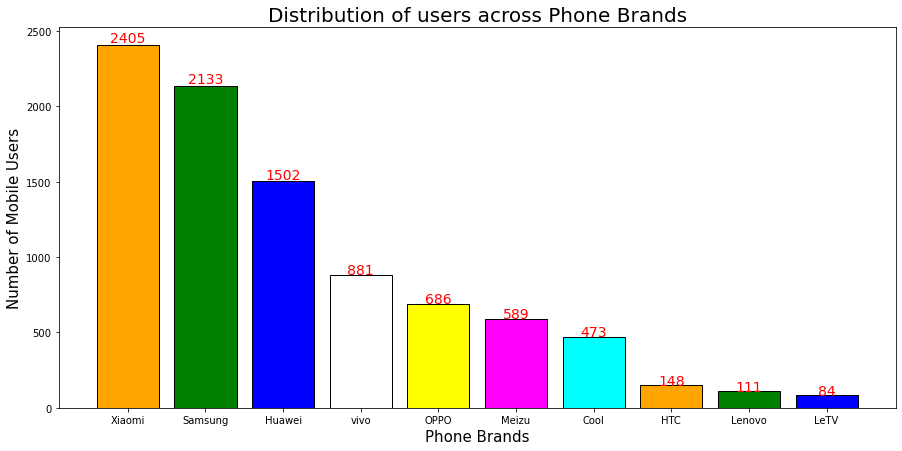

In [109]:
fig = plt.figure(figsize = [15,7])

x = ph_brand.index 
y = ph_brand.values
colors = ["orange","green","blue","white","yellow","magenta","cyan"]
figure = fig.add_subplot(1,1,1)
bar_chart = figure.bar(x,y ,edgecolor = 'black' , color = colors)

for bar in bar_chart:
    height = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2.0 , height*1.01 , s= '{}' .format(str(height)),horizontalalignment = 'center', rotation = 0 , size = 14 , color = 'red')
    


plt.ylabel("Number of Mobile Users",fontsize=15)
plt.xlabel("Phone Brands",fontsize=15)
plt.title("Distribution of users across Phone Brands",fontsize=20)
plt.show()

 **Plot shows that xiaomi phone brand is used more compare to other brands.**

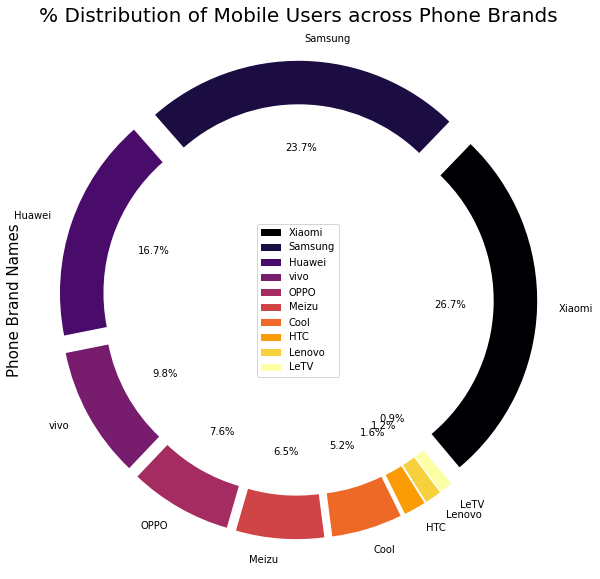

In [110]:
ph_brand.plot(kind = 'pie',figsize = [10,10],explode = np.ones(10)/10 ,autopct= '%3.1f%%',legend=True, wedgeprops={'width':0.20},
                                                                       shadow=False,cmap='inferno',startangle=310)
plt.ylabel("Phone Brand Names",fontsize=15)
plt.title("% Distribution of Mobile Users across Phone Brands",fontsize=20)
plt.show()

**There are around 27% of users uses Xiaomi brand , 24% uses Samsung and 17% uses Huawei.These 3 companies comprise more than 68% of market share in these 6 states.**

<a name = SectionQ3></a>
### Q3. Distribution of Users across Gender

In [181]:
gender = telecom_data.groupby(['gender'])['device_id'].nunique()
gender

gender
F    3562
M    5976
Name: device_id, dtype: int64

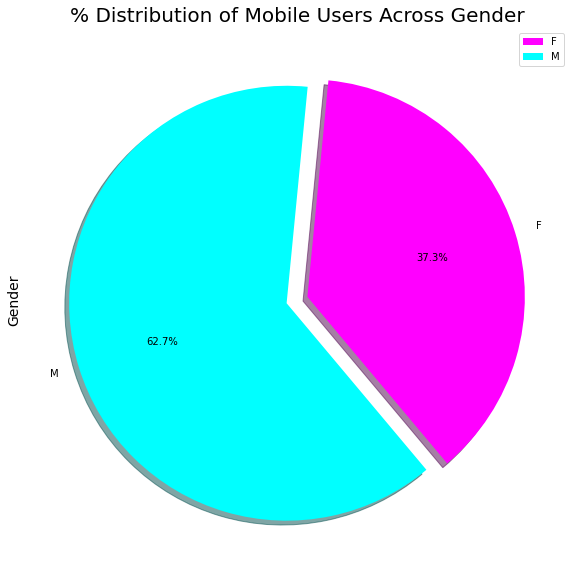

In [182]:
gender.plot(kind ='pie',figsize = [10,10],explode = [0.05,0.05],shadow = True ,autopct= '%3.1f%%',legend=True,cmap='cool_r',startangle=310)

plt.ylabel("Gender",fontsize=14)
plt.title("% Distribution of Mobile Users Across Gender",fontsize=20)
plt.show()

**Company have more Males users(62.7%) compare to female users(37.3%) across 6 states.** 

<a name = SectionQ4></a>
### Q4.Distribution of Users across Age Segments.

In [112]:
telecom_data['age'].value_counts().sort_index()

10       38
12        7
13       29
14      220
15     1377
16      972
17     2574
18     4587
19    10024
20    18280
21    26372
22    16150
23    17899
24    20839
25    27000
26    35541
27    22218
28    22332
29    31534
30    24561
31    25286
32    53993
33    18172
34    12839
35    13330
36    10304
37    10287
38     8222
39     7847
40     6246
41     8911
42     6503
43    22680
44     2657
45     3830
46     4911
47     2184
48     4686
49     5323
50     1777
51     2595
52     1531
53     2248
54     1936
55      661
56      325
57      488
58      340
59      951
60     1345
61      645
62      801
63     2474
64      521
65      145
66      732
67      125
68      151
69      502
70        1
71      112
72      209
73      320
74      423
75       17
76      885
77       34
78       22
79        5
80       34
83      210
87        7
89      178
Name: age, dtype: int64

In [113]:
telecom_data['group'].value_counts().sort_index()

F23-      34240
F24-26    32247
F27-28    16456
F29-32    34721
F33-42    32797
F43+      22623
M22-      51308
M23-26    64114
M27-28    28094
M29-31    53255
M32-38    97755
M39+      65905
Name: group, dtype: int64

In [114]:
telecom_data['age_segments']='10-89'
telecom_data.loc[telecom_data[telecom_data['age']<20].index,'age_segments']='10-19'
telecom_data.loc[telecom_data[(telecom_data['age']>=20) & (telecom_data['age']<=26)].index,'age_segments']='20-26'
telecom_data.loc[telecom_data[(telecom_data['age']>=27) & (telecom_data['age']<=28)].index,'age_segments']='27-28'
telecom_data.loc[telecom_data[(telecom_data['age']>=29) & (telecom_data['age']<=32)].index,'age_segments']='29-32'
telecom_data.loc[telecom_data[(telecom_data['age']>=33) & (telecom_data['age']<=40)].index,'age_segments']='33-40'
telecom_data.loc[telecom_data[telecom_data['age']>=41].index,'age_segments']='41+'

In [115]:
telecom_data['age_segments'].value_counts().sort_index()

10-19     19828
20-26    162081
27-28     44550
29-32    135374
33-40     87247
41+       84435
Name: age_segments, dtype: int64

In [116]:
age = telecom_data.groupby(['age_segments'])['device_id'].nunique().sort_index()
age

age_segments
10-19     424
20-26    3110
27-28    1065
29-32    1755
33-40    1699
41+      1485
Name: device_id, dtype: int64

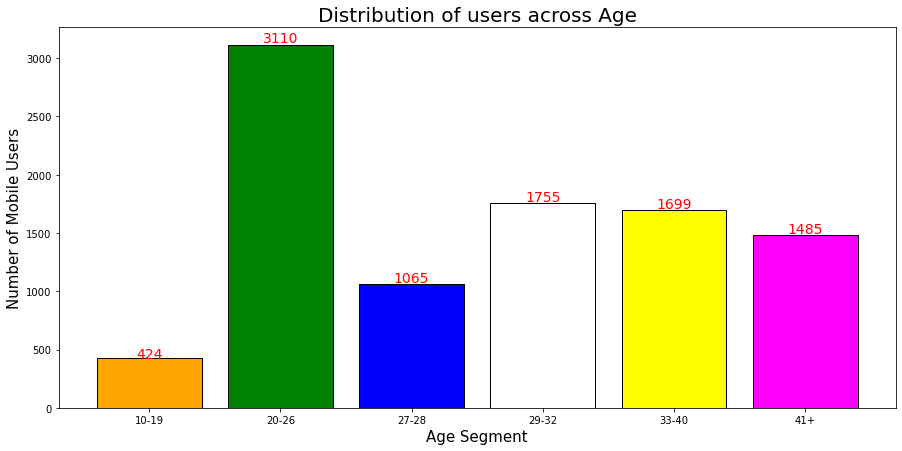

In [117]:
fig = plt.figure(figsize = [15,7])

x = age.index 
y = age.values
colors = ["orange","green","blue","white","yellow","magenta","cyan"]
figure = fig.add_subplot(1,1,1)
bar_chart = figure.bar(x,y ,edgecolor = 'black' , color = colors)

for bar in bar_chart:
    height = bar.get_height()
    plt.text(bar.get_x()+bar.get_width()/2.0 , height*1.01 , s= '{}' .format(str(height)),horizontalalignment = 'center', rotation = 0 , size = 14 , color = 'red')
    


plt.ylabel("Number of Mobile Users",fontsize=15)
plt.xlabel("Age Segment",fontsize=15)
plt.title("Distribution of users across Age",fontsize=20)
plt.show()

**More users are from 20 to 26 years age group who uses InsaidTelecom network more compare to other age groups.**

<a name = SectionQ5></a>
### Q5.Distribution of Phone Brands(Consider only the 10 Most used Phone Brands) for each Age Segment, State, and Gender.

In [118]:
brand = telecom_data.groupby(['phone_brand'])['device_id'].nunique().sort_values(ascending = False)[:10].index.to_list()
brand


['Xiaomi',
 'Samsung',
 'Huawei',
 'vivo',
 'OPPO',
 'Meizu',
 'Cool',
 'HTC',
 'Lenovo',
 'LeTV']

In [119]:
telecom_data[telecom_data['phone_brand'].isin(brand)].groupby(['state','gender','age_segments','phone_brand'])['device_id'].nunique()[:10]

state             gender  age_segments  phone_brand
ArunachalPradesh  F       20-26         Huawei         2
                                        Samsung        2
                                        Xiaomi         1
                                        vivo           1
                          29-32         HTC            1
                                        OPPO           1
                          33-40         Meizu          1
                  M       10-19         Samsung        1
                          20-26         HTC            1
                                        Huawei         1
Name: device_id, dtype: int64

In [120]:
df_age_brand = pd.DataFrame(telecom_data[telecom_data['phone_brand'].isin(brand)].groupby(['age_segments','phone_brand'])['device_id'].nunique())
df_age_brand.reset_index(level = [0,1] , inplace = True)
df_age_brand.rename(columns = {'device_id': 'users_count'} , inplace = True)
df_age_brand.head(10)


,age_segments,phone_brand,users_count
0,10-19,Cool,17
1,10-19,HTC,6
2,10-19,Huawei,54
3,10-19,LeTV,2
4,10-19,Lenovo,5
5,10-19,Meizu,26
6,10-19,OPPO,42
7,10-19,Samsung,79
8,10-19,Xiaomi,120
9,10-19,vivo,44


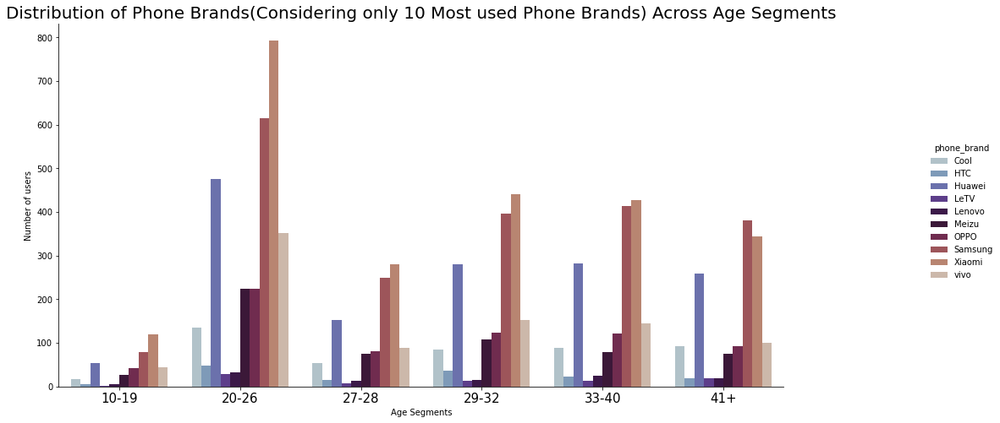

In [121]:
ax = sns.catplot(x='age_segments', y='users_count', hue='phone_brand', data=df_age_brand ,kind='bar',palette='twilight')

    
ax.set_axis_labels("Age Segments","Number of users")
ax.set_xticklabels(fontsize=15,rotation=0)
ax.fig.set_figwidth(18)
ax.fig.set_figheight(7)

plt.title("Distribution of Phone Brands(Considering only 10 Most used Phone Brands) Across Age Segments",fontsize=20)
plt.show()


**Age between 20 to 26 years age group use Xiaomi,Samsung and Huawei brand more compare to other age groups. 
Users of almost all age groups except 41+ prefer Xiaomi phone brand followed by Samsung. However in 41+ age group they prefer Samsung Brand phones.**

In [188]:
df_gender_brand = pd.DataFrame(telecom_data[telecom_data['phone_brand'].isin(brand)].groupby(['gender','phone_brand'])['device_id'].nunique())
df_gender_brand.reset_index(level = [0,1] , inplace = True)
df_gender_brand.rename(columns = {'device_id': 'users_count'} , inplace = True)
df_gender_brand.head

<bound method NDFrame.head of    gender phone_brand  users_count
0       F        Cool          152
1       F         HTC           41
2       F      Huawei          562
3       F        LeTV           27
4       F      Lenovo           35
5       F       Meizu          189
6       F        OPPO          271
7       F     Samsung          840
8       F      Xiaomi          896
9       F        vivo          359
10      M        Cool          321
11      M         HTC          107
12      M      Huawei          940
13      M        LeTV           57
14      M      Lenovo           76
15      M       Meizu          400
16      M        OPPO          415
17      M     Samsung         1293
18      M      Xiaomi         1509
19      M        vivo          522>

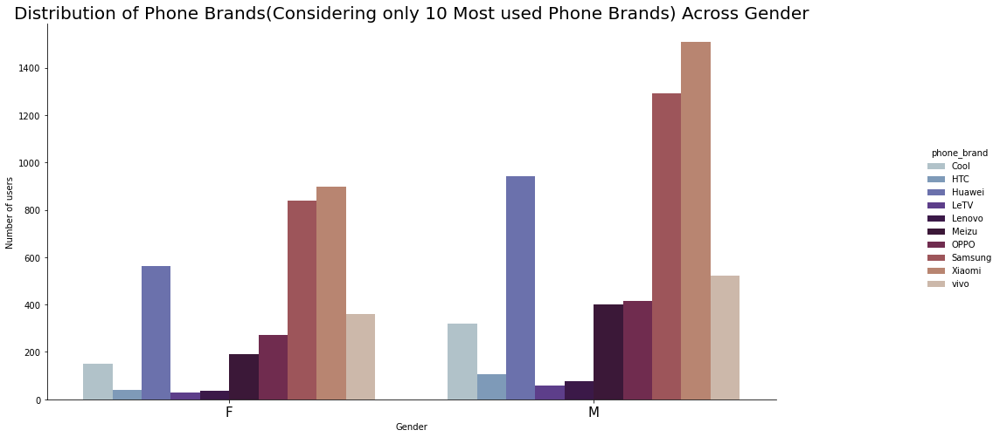

In [177]:
ax = sns.catplot(x='gender', y='users_count', hue='phone_brand', data=df_gender_brand ,kind='bar',palette='twilight')

    
ax.set_axis_labels("Gender","Number of users")
ax.set_xticklabels(fontsize=15,rotation=0)
ax.fig.set_figwidth(18)
ax.fig.set_figheight(7)

plt.title("Distribution of Phone Brands(Considering only 10 Most used Phone Brands) Across Gender",fontsize=20)
plt.show()


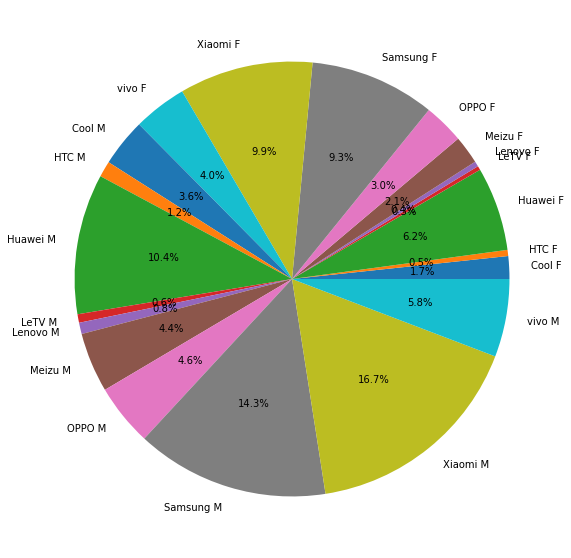

In [187]:
labels = df_gender_brand["phone_brand"]+ " " + df_gender_brand["gender"].map(str)

sizes = df_gender_brand["users_count"]

fig = plt.figure(figsize = [10,10])
plt.pie(sizes, labels=labels,autopct='%1.1f%%')
plt.show()

**Both Male and Female users prefer Xiaomi brand followed by samsung .**

In [124]:
df_state_brand = pd.DataFrame(telecom_data[telecom_data['phone_brand'].isin(brand)].groupby(['state','phone_brand'])['device_id'].nunique())
df_state_brand.reset_index(level = [0,1] , inplace = True)
df_state_brand.rename(columns = {'device_id': 'users_count'} , inplace = True)
df_state_brand.head(10)

,state,phone_brand,users_count
0,ArunachalPradesh,HTC,3
1,ArunachalPradesh,Huawei,4
2,ArunachalPradesh,Meizu,3
3,ArunachalPradesh,OPPO,2
4,ArunachalPradesh,Samsung,9
5,ArunachalPradesh,Xiaomi,6
6,ArunachalPradesh,vivo,2
7,Chandigarh,Cool,3
8,Chandigarh,Huawei,5
9,Chandigarh,LeTV,2


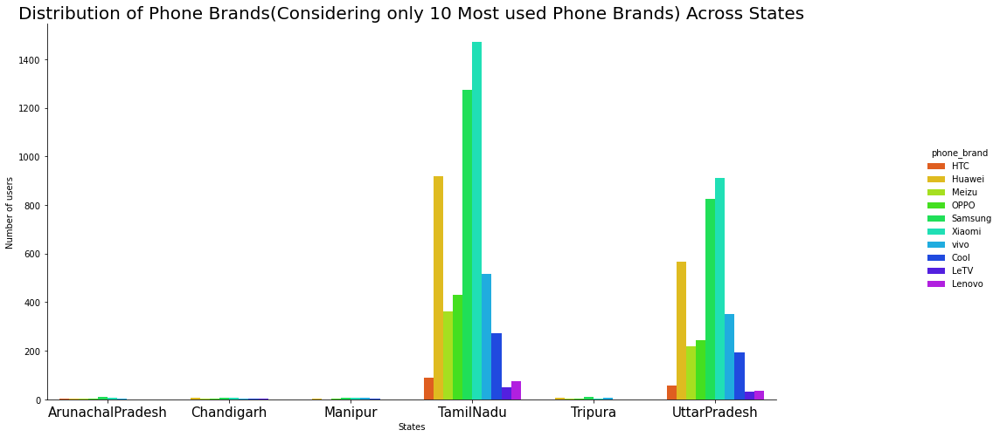

In [125]:
ax = sns.catplot(x='state', y='users_count', hue='phone_brand', data=df_state_brand ,kind='bar',palette='gist_rainbow')

    
ax.set_axis_labels("States","Number of users")
ax.set_xticklabels(fontsize=15,rotation=0)
ax.fig.set_figwidth(18)
ax.fig.set_figheight(7)

plt.title("Distribution of Phone Brands(Considering only 10 Most used Phone Brands) Across States",fontsize=20)
plt.show()


**Amoung 6 sates TamilNadu and UttarPradesh have more mobile users and these people prefer Xiaomi brand followed by Samsung brand phones.**

<a name = SectionQ6></a>
### Q6.Distribution of Gender for each State, Age Segment and Phone Brand(Consider only the 10 Most used Phone Brands).

In [126]:
s = pd.DataFrame(telecom_data.groupby(['state','gender'])['device_id'].nunique())
s.reset_index(level = [0,1] , inplace = True)
s

,state,gender,device_id
0,ArunachalPradesh,F,11
1,ArunachalPradesh,M,21
2,Chandigarh,F,15
3,Chandigarh,M,20
4,Manipur,F,9
5,Manipur,M,21
6,TamilNadu,F,2165
7,TamilNadu,M,3605
8,Tripura,F,18
9,Tripura,M,18


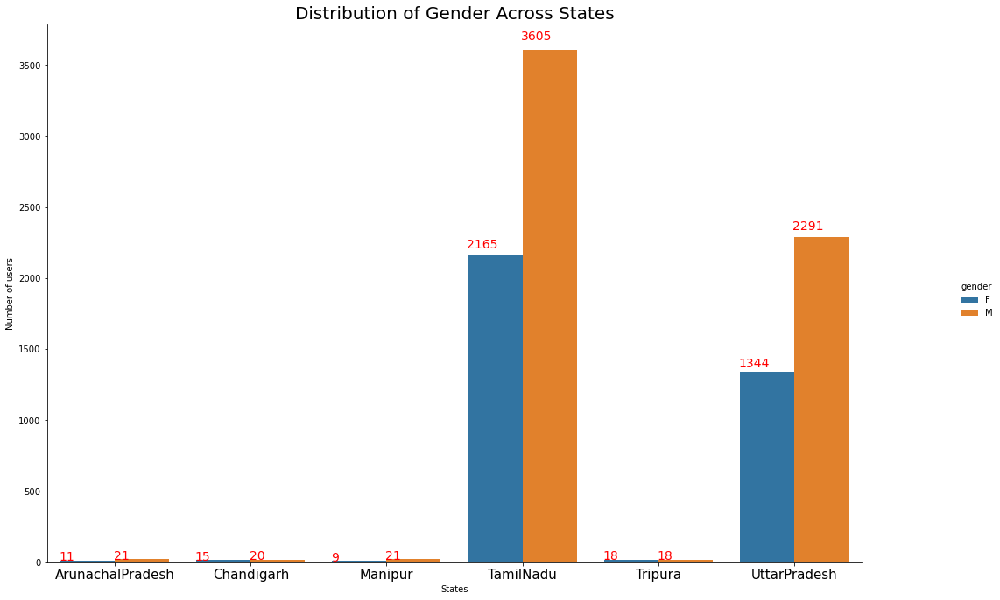

In [127]:
graph = sns.catplot(x='state', y='device_id', hue='gender', data=s ,kind='bar',palette='tab10')

ax = graph.facet_axis(0, 0)

# iterate through the axes containers
for p in ax.patches:
    ax.text(p.get_x() - 0.01, 
            p.get_height() * 1.02, 
           '{}'.format(int(p.get_height())),   #Used to format it K representation
            color='red', 
            rotation='horizontal', 
            size=14)
    
graph.set_axis_labels("States","Number of users")
graph.set_xticklabels(fontsize=15,rotation=0)
graph.fig.set_figwidth(18)
graph.fig.set_figheight(10)

plt.title("Distribution of Gender Across States",fontsize=20)
plt.show()

**Across 6 states only TamilNadu and Uttarpradesh have more male and female users compare to other states.**

In [128]:
ag = pd.DataFrame(telecom_data.groupby(['age_segments','gender'])['device_id'].nunique())
ag.reset_index(level = [0,1] , inplace = True)
ag

,age_segments,gender,device_id
0,10-19,F,125
1,10-19,M,299
2,20-26,F,1149
3,20-26,M,1961
4,27-28,F,400
5,27-28,M,665
6,29-32,F,646
7,29-32,M,1109
8,33-40,F,600
9,33-40,M,1099


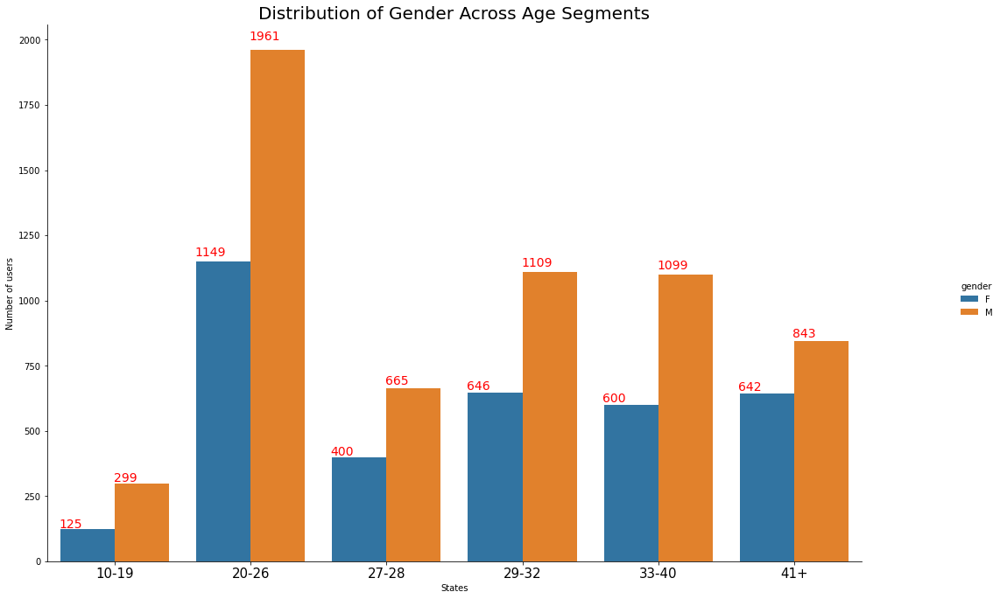

In [129]:
ax1 = sns.catplot(x='age_segments', y='device_id', hue='gender', data= ag ,kind='bar',palette='tab10')

a = ax1.facet_axis(0, 0)

# iterate through the axes containers
for p in a.patches:
    a.text(p.get_x() - 0.01, 
            p.get_height() * 1.02, 
           '{}'.format(int(p.get_height())),   #Used to format it K representation
            color='red', 
            rotation='horizontal', 
            size=14)
    
ax1.set_axis_labels("States","Number of users")
ax1.set_xticklabels(fontsize=15,rotation=0)
ax1.fig.set_figwidth(18)
ax1.fig.set_figheight(10)

plt.title("Distribution of Gender Across Age Segments",fontsize=20)
plt.show()

**All age segments have majority of Male users.**

In [130]:
ph_brand = telecom_data.groupby(['phone_brand'])['device_id'].nunique().sort_values(ascending=False)[:10].index.to_list()
ph_brand

['Xiaomi',
 'Samsung',
 'Huawei',
 'vivo',
 'OPPO',
 'Meizu',
 'Cool',
 'HTC',
 'Lenovo',
 'LeTV']

In [131]:
pb = pd.DataFrame(telecom_data[telecom_data['phone_brand'].isin(ph_brand)].groupby(['gender','phone_brand'])['device_id'].nunique() )
pb.reset_index(level = [0,1] , inplace = True)
pb

,gender,phone_brand,device_id
0,F,Cool,152
1,F,HTC,41
2,F,Huawei,562
3,F,LeTV,27
4,F,Lenovo,35
5,F,Meizu,189
6,F,OPPO,271
7,F,Samsung,840
8,F,Xiaomi,896
9,F,vivo,359


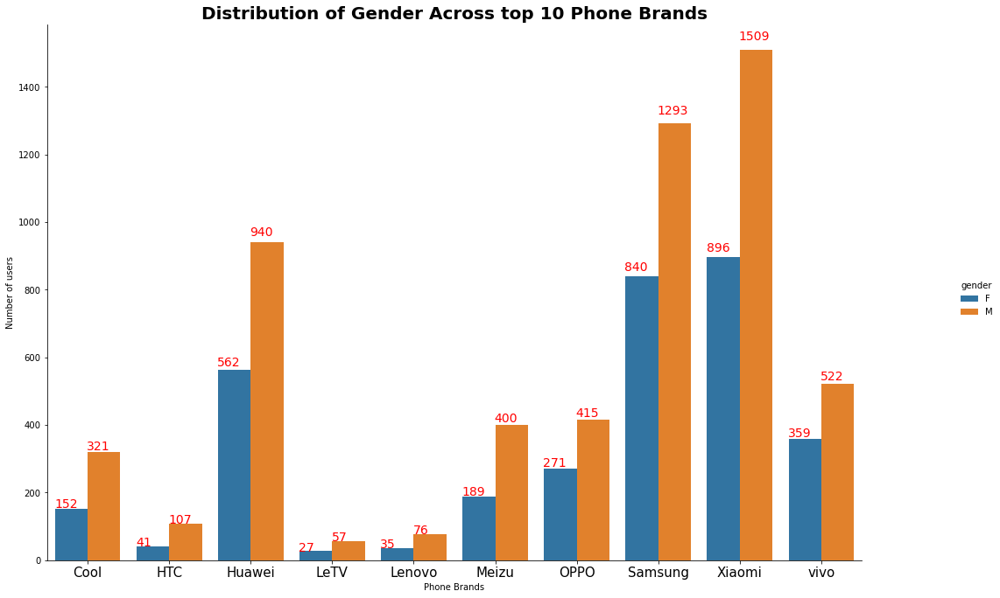

In [132]:
# figure = plt.figure(figsize = [18,10])
ax2 = sns.catplot(x='phone_brand', y='device_id', hue='gender', data= pb ,kind='bar',palette='tab10')

a = ax2.facet_axis(0, 0)

# iterate through the axes containers
for p in a.patches:
    a.text(p.get_x() - 0.01, 
            p.get_height() * 1.02, 
           '{}'.format(int(p.get_height())),   #Used to format it K representation
            color='red', 
            rotation='horizontal', 
            size=14)
    
ax2.set_axis_labels("Phone Brands","Number of users")
ax2.set_xticklabels(fontsize=15,rotation=0)
ax2.fig.set_figwidth(18)
ax2.fig.set_figheight(10)

plt.title("Distribution of Gender Across top 10 Phone Brands",fontsize=20,fontdict={"weight": "bold"})
plt.show()

- **If we see distribution of genders across top 10 phone brands , we can see that majority of users for each brand are Male.**
- **They Prefer Xiaomi brand follwed by Samsung phones .**

In [133]:
gen =pd.DataFrame(telecom_data.groupby(['state','age_segments','gender'])['device_id'].nunique())
gen.reset_index(level = [0,1,2] , inplace = True)
gen

,state,age_segments,gender,device_id
0,ArunachalPradesh,10-19,F,1
1,ArunachalPradesh,10-19,M,1
2,ArunachalPradesh,20-26,F,6
3,ArunachalPradesh,20-26,M,8
4,ArunachalPradesh,27-28,M,4
5,ArunachalPradesh,29-32,F,3
6,ArunachalPradesh,29-32,M,4
7,ArunachalPradesh,33-40,F,1
8,ArunachalPradesh,33-40,M,3
9,ArunachalPradesh,41+,M,1


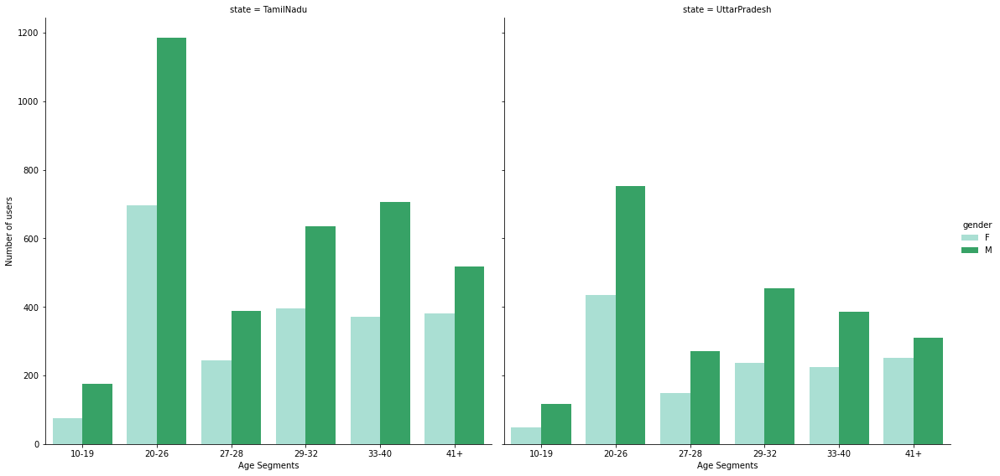

In [134]:
g=sns.catplot(x='age_segments', y='device_id', hue='gender', col = 'state',data= gen[gen.state.isin(['UttarPradesh','TamilNadu'])], height=8, kind='bar', 
            palette='BuGn',col_wrap=2,dodge=True,ci=None,saturation=1)
g.set_axis_labels("Age Segments","Number of users")


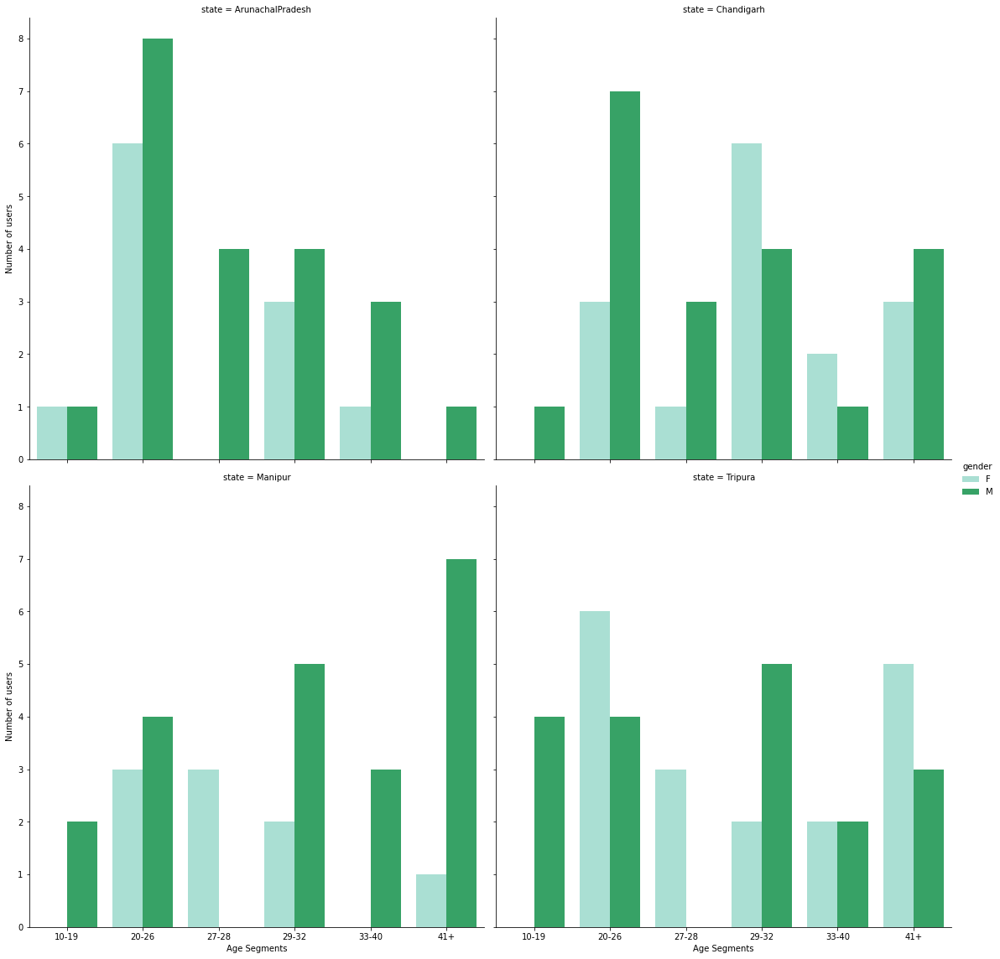

In [135]:
g=sns.catplot(x='age_segments', y='device_id', hue='gender', col = 'state',data= gen[~gen.state.isin(['UttarPradesh','TamilNadu'])], height=8, kind='bar', 
            palette='BuGn',col_wrap=2,dodge=True,ci=None,saturation=1)
g.set_axis_labels("Age Segments","Number of users")

**Among all 6 states ( except Tripura ) Male users are more in all age segments.**

<a name = SectionQ7></a>
### Q7.Distribution of Age Segments for each State, Gender and Phone Brand(Consider only the 10 Most used Phone Brands).

In [136]:
telecom_data['age_segments'].value_counts()

20-26    162081
29-32    135374
33-40     87247
41+       84435
27-28     44550
10-19     19828
Name: age_segments, dtype: int64

In [137]:
age_state = pd.DataFrame(telecom_data.groupby(['state','age_segments'])['device_id'].nunique())
age_state.reset_index(level = [0,1] , inplace = True)
age_state

,state,age_segments,device_id
0,ArunachalPradesh,10-19,2
1,ArunachalPradesh,20-26,14
2,ArunachalPradesh,27-28,4
3,ArunachalPradesh,29-32,7
4,ArunachalPradesh,33-40,4
5,ArunachalPradesh,41+,1
6,Chandigarh,10-19,1
7,Chandigarh,20-26,10
8,Chandigarh,27-28,4
9,Chandigarh,29-32,10


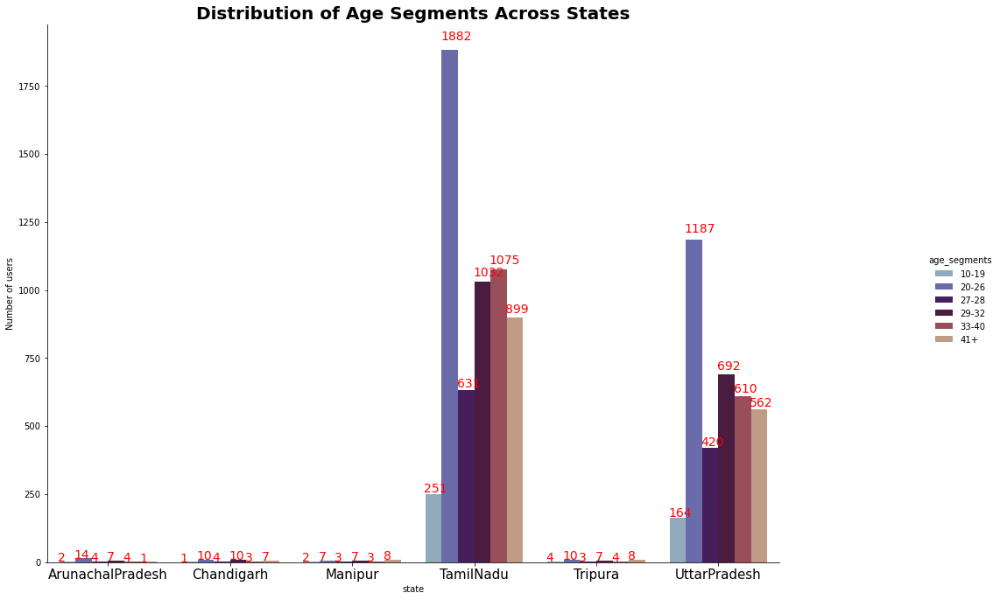

In [138]:
age_st = sns.catplot(x='state' , y = 'device_id',hue ='age_segments' , data = age_state, kind = 'bar' , palette = 'twilight')

a = age_st.facet_axis(0, 0)

# iterate through the axes containers
for p in a.patches:
    a.text(p.get_x() - 0.01, 
            p.get_height() * 1.02, 
           '{}'.format(int(p.get_height())),   #Used to format it K representation
            color='red', 
            rotation='horizontal', 
            size=14)
    
age_st.set_axis_labels("state","Number of users")
age_st.set_xticklabels(fontsize=15,rotation=0)
age_st.fig.set_figwidth(18)
age_st.fig.set_figheight(10)

plt.title("Distribution of Age Segments Across States",fontsize=20,fontdict={"weight": "bold"})
plt.show()

**For all states, more users belong to the age group of 20 to 26 years. Majority of users (more than 80% of all) falls under 20 to 40 years age group.Top states are TamilNadu and Uttarpradesh.**

In [139]:
age_gender = pd.DataFrame(telecom_data.groupby(['gender','age_segments'])['device_id'].nunique())
age_gender.reset_index(level = [0,1] , inplace = True)
age_gender

,gender,age_segments,device_id
0,F,10-19,125
1,F,20-26,1149
2,F,27-28,400
3,F,29-32,646
4,F,33-40,600
5,F,41+,642
6,M,10-19,299
7,M,20-26,1961
8,M,27-28,665
9,M,29-32,1109


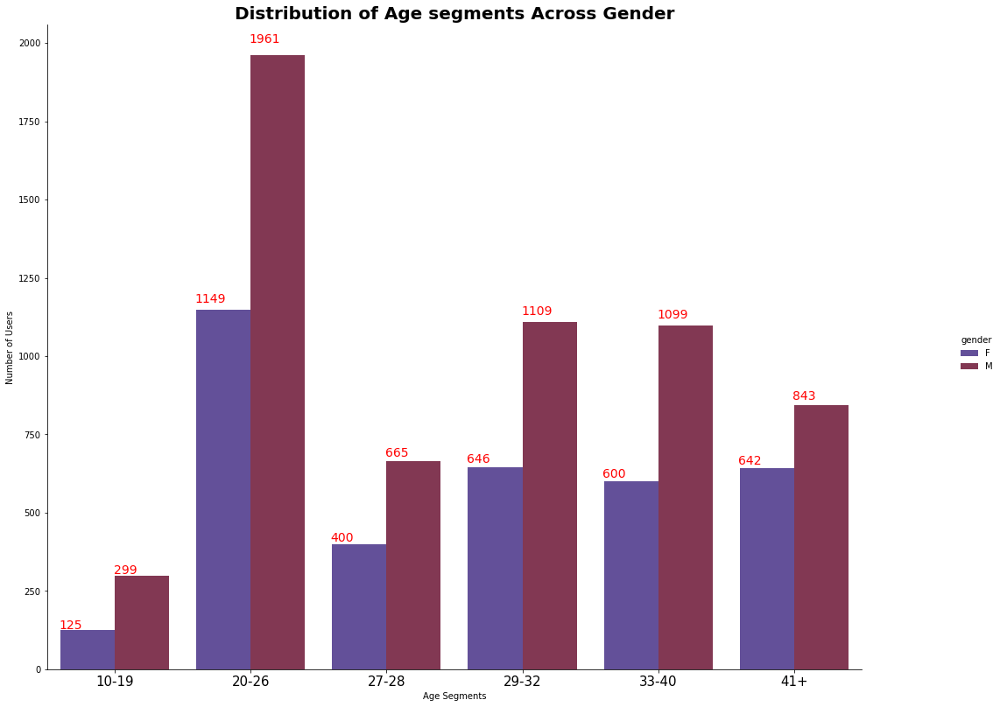

In [140]:
age_g = sns.catplot(x = 'age_segments' , y = 'device_id', hue = 'gender' , data = age_gender , kind = 'bar' , palette = 'twilight')
a = age_g.facet_axis(0,0)

#iterate through the axis containers to get the values 

for p in a.patches:
    a.text(p.get_x()-0.01,
          p.get_height()*1.02,
          '{}'.format(int(p.get_height())),
          color = 'red',
          rotation = 'horizontal',size =14)
age_g.set_axis_labels('Age Segments','Number of Users')
age_g.set_xticklabels(fontsize = 15 , rotation =0)
age_g.fig.set_figwidth(18)
age_g.fig.set_figheight(12)

plt.title('Distribution of Age segments Across Gender' , fontsize = 20 , fontdict = {'weight':'bold'})
plt.show()

  

**We can seen from above plot that Male users are more in all age segments compare to female users.** 

In [141]:
brand

['Xiaomi',
 'Samsung',
 'Huawei',
 'vivo',
 'OPPO',
 'Meizu',
 'Cool',
 'HTC',
 'Lenovo',
 'LeTV']

In [142]:
age_ph = pd.DataFrame(telecom_data[telecom_data['phone_brand'].isin(brand)].groupby(['phone_brand','age_segments'])['device_id'].nunique())
age_ph.reset_index(level = [0,1], inplace = True)
age_ph

,phone_brand,age_segments,device_id
0,Cool,10-19,17
1,Cool,20-26,136
2,Cool,27-28,53
3,Cool,29-32,85
4,Cool,33-40,89
5,Cool,41+,93
6,HTC,10-19,6
7,HTC,20-26,48
8,HTC,27-28,16
9,HTC,29-32,37


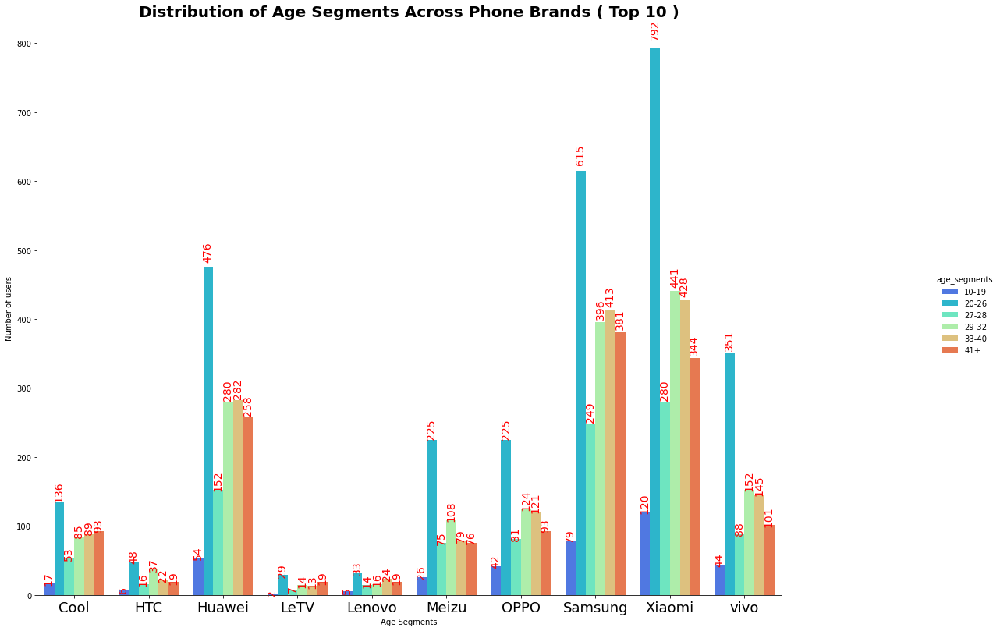

In [143]:
age_p = sns.catplot(x = 'phone_brand' , y = 'device_id' , hue = 'age_segments', kind = 'bar' , data = age_ph , palette = 'rainbow')
a = age_p.facet_axis(0, 0)

# iterate through the axes containers
for p in a.patches:
    a.text(p.get_x() - 0.01, 
            p.get_height() * 1.02, 
           '{}'.format(int(p.get_height())),   #Used to format it K representation
            color='red', 
            rotation='vertical', 
            size=14)
    
age_p.set_axis_labels("Age Segments","Number of users")
age_p.set_xticklabels(fontsize=18,rotation=0)
age_p.fig.set_figwidth(20)
age_p.fig.set_figheight(12)

plt.title("Distribution of Age Segments Across Phone Brands ( Top 10 )",fontsize=20,fontdict={"weight": "bold"})
plt.show()

**We can see from above plot that across top 10 phone brands, maximum users belong to the age group of 20 to 26 years. Majority of users fall under 20 to 40 years of age group.Most of the users use Xiaomi brand followed by Samsung phones.**

<a name = SectionQ8></a>
### Q8. Hourly distribution of Phone Calls.

In [144]:
telecom_data['timestamp'][:10]

0   2016-05-03 13:21:16
1   2016-05-05 12:44:32
2   2016-05-02 12:45:05
3   2016-05-02 03:37:12
4   2016-05-04 19:18:59
5   2016-05-04 04:32:21
6   2016-05-02 06:20:12
7   2016-05-01 19:34:56
8   2016-05-05 12:20:28
9   2016-05-06 18:52:25
Name: timestamp, dtype: datetime64[ns]

In [145]:
telecom_data['timestamp'].dt.year.value_counts()

2016    533515
Name: timestamp, dtype: int64

In [146]:
telecom_data['timestamp'].dt.month.value_counts()

5    533297
4       218
Name: timestamp, dtype: int64

In [147]:
telecom_data['timestamp'].dt.time.value_counts()[:10]

00:01:14    25
00:04:28    23
10:00:03    23
00:05:46    22
00:08:00    21
00:09:25    21
00:01:55    21
10:00:05    20
00:04:08    20
20:49:17    20
Name: timestamp, dtype: int64

In [148]:
telecom_data['timestamp'].dt.hour[:10]

0    13
1    12
2    12
3     3
4    19
5     4
6     6
7    19
8    12
9    18
Name: timestamp, dtype: int64

In [149]:
telecom_data['timestamp'].dt.date.value_counts()

2016-05-03    80380
2016-05-05    78118
2016-05-01    77371
2016-05-02    75296
2016-05-04    74775
2016-05-06    74202
2016-05-07    73155
2016-04-30      218
Name: timestamp, dtype: int64

In [150]:
telecom_data['date'] = telecom_data['timestamp'].dt.date
telecom_data['hour'] = telecom_data['timestamp'].dt.hour

In [151]:
telecom_data.sample()

,event_id,device_id,timestamp,longitude,latitude,city,state,phone_brand,device_model,gender,age,group,age_segments,date,hour
135362,2100090,423450880876570368.00000,2016-05-03 01:36:17,80.30241,13.12448,Chennai,TamilNadu,vivo,Y613F,F,25,F24-26,20-26,2016-05-03,1


In [152]:
telecom_data.groupby(['date','hour'])['event_id'].count()[:10]

date        hour
2016-04-30  23       218
2016-05-01  0       4891
            1       2909
            2       2018
            3       1847
            4       1340
            5       1577
            6       2258
            7       2720
            8       3051
Name: event_id, dtype: int64

In [153]:
event_time = pd.DataFrame(telecom_data.groupby(['date','hour'])['event_id'].count())
event_time.reset_index(level = [0,1] , inplace = True)
event_time.head()


,date,hour,event_id
0,2016-04-30,23,218
1,2016-05-01,0,4891
2,2016-05-01,1,2909
3,2016-05-01,2,2018
4,2016-05-01,3,1847


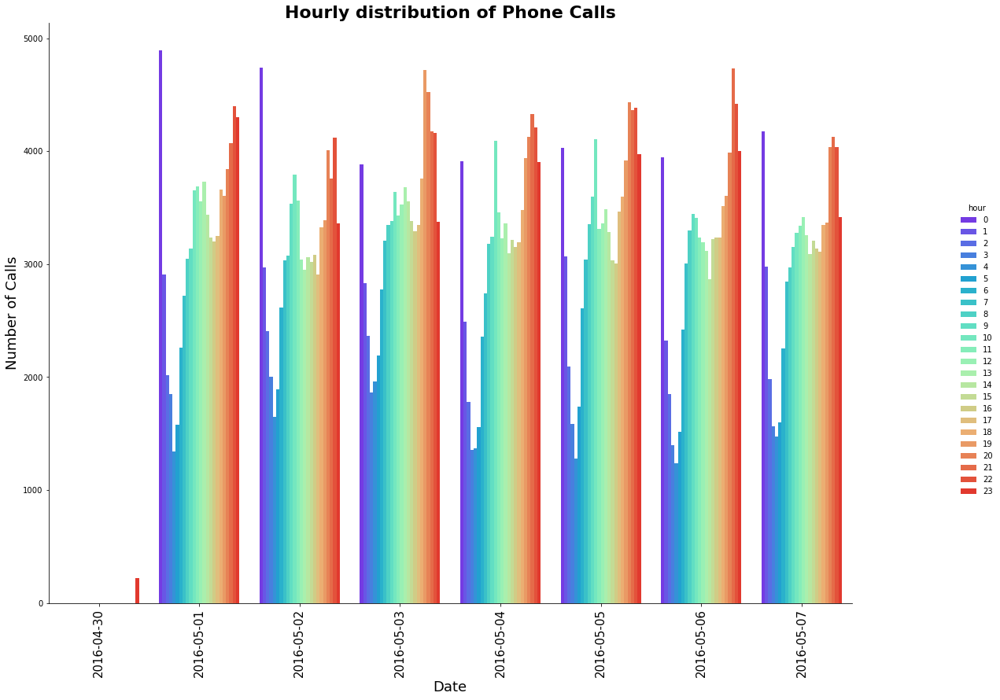

In [202]:
s =sns.catplot(x='date', y = 'event_id', hue = 'hour', data = event_time , kind = 'bar' , palette = 'rainbow')
s.fig.set_figwidth(20)
s.fig.set_figheight(12)
s.set_axis_labels("Date","Number of Calls", fontsize = 18)
s.set_xticklabels(fontsize=15,rotation=90)
plt.title("Hourly distribution of Phone Calls", fontsize=22,fontdict={"weight": "bold"})
plt.show()

**From above plot we can observe that , most of the calls happened between 8pm to 1 AM  and also between 8 AM to 11 AM.** 

In [192]:
event_time_age = pd.DataFrame(telecom_data.groupby(['hour','age_segments'])['event_id'].count())
event_time_age.reset_index(level = [0,1] , inplace = True)
event_time_age.head()

,hour,age_segments,event_id
0,0,10-19,1041
1,0,20-26,9562
2,0,27-28,2709
3,0,29-32,6105
4,0,33-40,5300


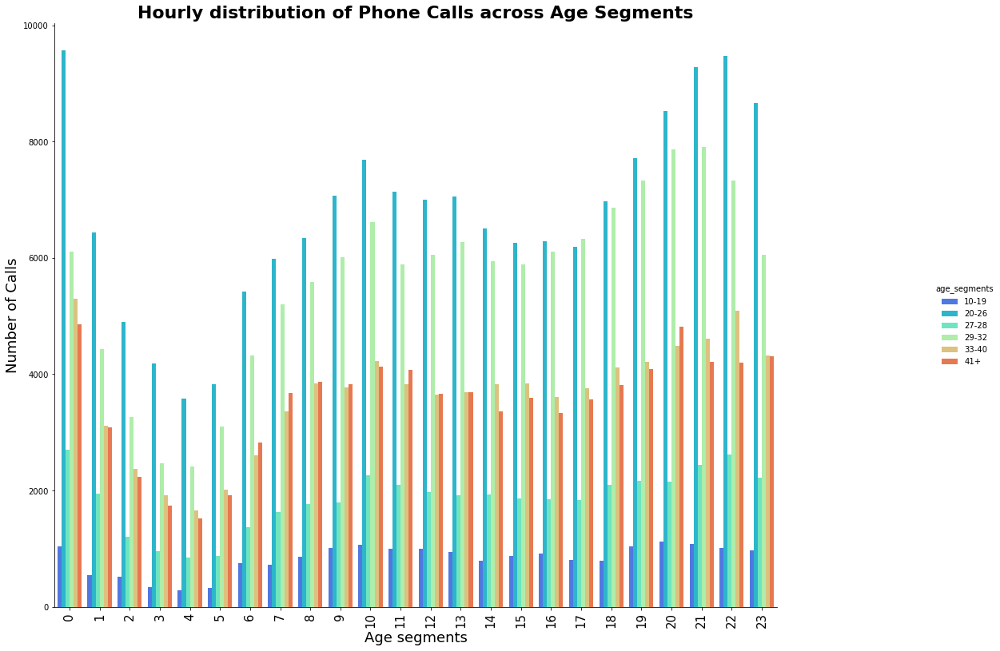

In [199]:
s =sns.catplot(x='hour', y = 'event_id', hue = 'age_segments', data = event_time_age , kind = 'bar' , palette = 'rainbow')
s.fig.set_figwidth(20)
s.fig.set_figheight(12)
s.set_axis_labels("Age segments","Number of Calls", fontsize = 18)
s.set_xticklabels(fontsize=15,rotation=90)
plt.title("Hourly distribution of Phone Calls across Age Segments", fontsize=22,fontdict={"weight": "bold"})
plt.show()

**Age groups between 20 to 26 years and 29 to 32 years have done more calls between 8PM to 1 AM & 9 Am to 11 Am compare to other age groups.**

In [195]:
event_time_gender = pd.DataFrame(telecom_data.groupby(['hour','gender'])['event_id'].count())
event_time_gender.reset_index(level = [0,1] , inplace = True)
event_time_gender.head()

,hour,gender,event_id
0,0,F,9574
1,0,M,20000
2,1,F,6898
3,1,M,12679
4,2,F,5121


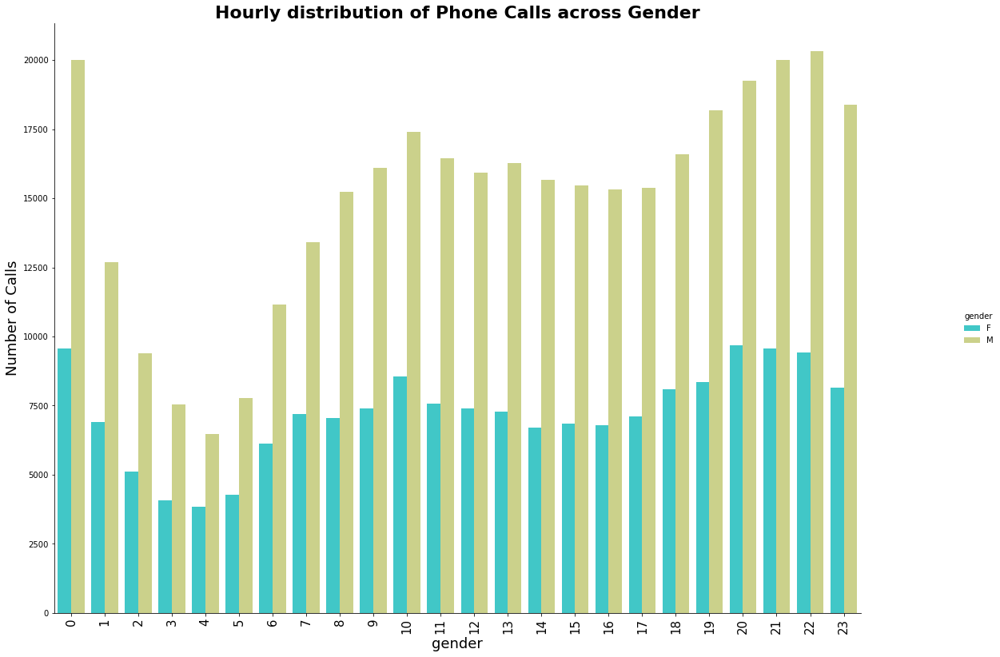

In [198]:
s =sns.catplot(x='hour', y = 'event_id', hue = 'gender', data = event_time_gender , kind = 'bar' , palette = 'rainbow')
s.fig.set_figwidth(20)
s.fig.set_figheight(12)
s.set_axis_labels("gender","Number of Calls", fontsize = 18)
s.set_xticklabels(fontsize=15,rotation=90)
plt.title("Hourly distribution of Phone Calls across Gender", fontsize=22,fontdict={"weight": "bold"})
plt.show()

**Male users have done more calls compare to Female users.**

<a name = SectionQ9></a>
### Q9 Frequency of Events with respect to Time

In [204]:
telecom_data['month'] = telecom_data['timestamp'].dt.month
telecom_data.sample()

,event_id,device_id,timestamp,longitude,latitude,city,state,phone_brand,device_model,gender,age,group,age_segments,date,hour,month
340578,1720044,4121916042077363200.00000,2016-05-01 15:53:12,80.79098,28.03837,Lakhimpur,UttarPradesh,Samsung,A380t,F,47,F43+,41+,2016-05-01,15,5


In [205]:
telecom_data['month'].value_counts()

5    533297
4       218
Name: month, dtype: int64

In [217]:
telecom_data['timestamp'].dt.year.value_counts()

2016    533515
Name: timestamp, dtype: int64

In [207]:
event_time_month = pd.DataFrame(telecom_data.groupby(['hour','month'])['event_id'].count())
event_time_month.reset_index(level = [0,1] , inplace = True)
event_time_month.head()

,hour,month,event_id
0,0,5,29574
1,1,5,19577
2,2,5,14501
3,3,5,11622
4,4,5,10310


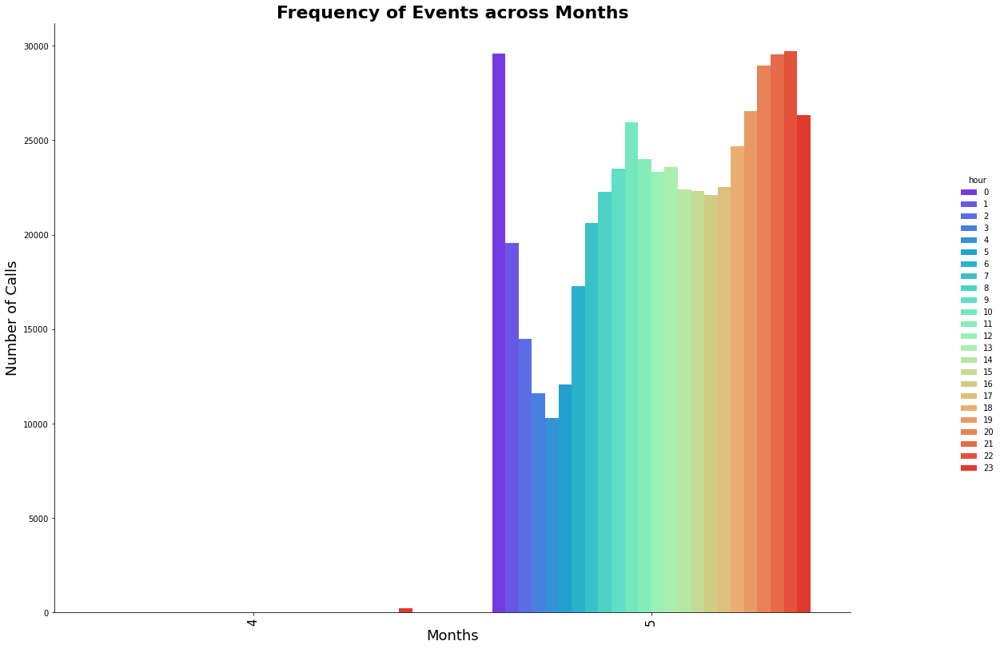

In [211]:
s =sns.catplot(x='month', y = 'event_id', hue = 'hour', data = event_time_month , kind = 'bar' , palette = 'rainbow')
s.fig.set_figwidth(20)
s.fig.set_figheight(12)
s.set_axis_labels("Months","Number of Calls", fontsize = 18)
s.set_xticklabels(fontsize=15,rotation=90)
plt.title("Frequency of Events across Months", fontsize=22,fontdict={"weight": "bold"})
plt.show()

**Most of the Events logged in May month only for the year 2016.**

In [203]:
event = pd.DataFrame(telecom_data.groupby(['hour'])['event_id'].nunique())
event.reset_index(level = [0], inplace = True)
event

,hour,event_id
0,0,29574
1,1,19577
2,2,14501
3,3,11622
4,4,10310
5,5,12065
6,6,17289
7,7,20598
8,8,22279
9,9,23488


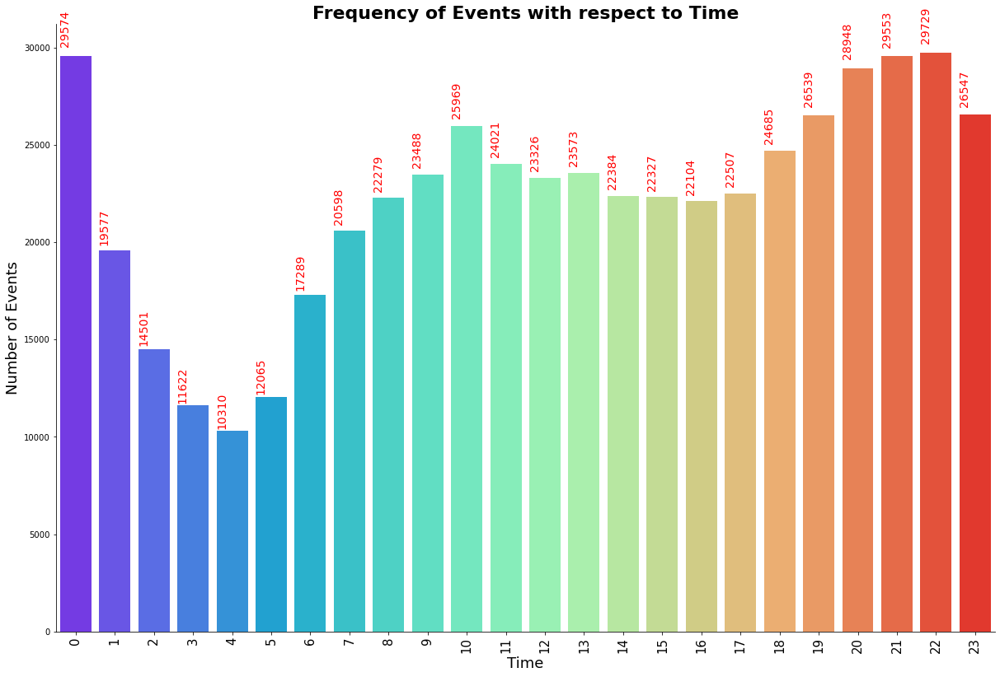

In [156]:
s =sns.catplot(x='hour', y = 'event_id',data = event, kind = 'bar' , palette = 'rainbow')
a = s.facet_axis(0, 0)

# iterate through the axes containers
for p in a.patches:
    a.text(p.get_x() - 0.01, 
            p.get_height() * 1.02, 
           '{}'.format(int(p.get_height())),   #Used to format it K representation
            color='red', 
            rotation='vertical', 
            size=14)
    
s.fig.set_figwidth(20)
s.fig.set_figheight(12)
s.set_axis_labels("Time","Number of Events", fontsize =18)
s.set_xticklabels(fontsize=15,rotation=90)
plt.title("Frequency of Events with respect to Time", fontsize=22,fontdict={"weight": "bold"})
plt.show()

**Most of the events logged between 7AM to midnight 12AM .**

<a name = SectionQ10></a>
### Q10. Distribution of  Users across Device Model(Top 10 models)

In [157]:
top_10 = telecom_data.groupby(['device_model'])['device_id'].nunique().sort_values(ascending =False )[:10]
top_10


device_model
Redmi Note         383
MI 3               324
MI 2S              308
Galaxy Note 3      242
MI 4               235
Galaxy Note 2      233
Galaxy S4          212
Redmi              161
Redmi 1S           146
Charm Blue NOTE    130
Name: device_id, dtype: int64

<AxesSubplot:xlabel='device_model'>

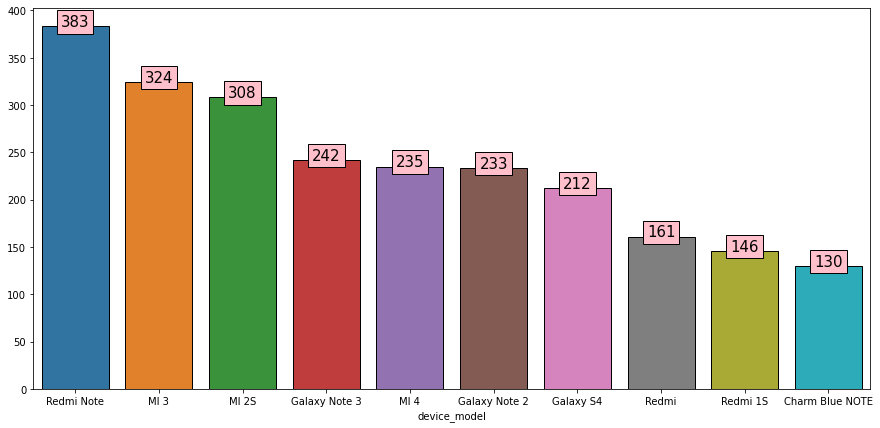

In [158]:
fig = plt.figure(figsize =[15,7])

x = top_10.index
y = top_10.values

def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i,y[i],y[i],fontsize = 15 ,horizontalalignment = 'center', color = 'black' ,Bbox = dict(facecolor = 'pink', alpha = 1))

addlabels(x,y)

sns.barplot(x,y,edgecolor='black')

**If we see distribution of users across top 10 device model , more users prefer Redmi Note forllowed by MI. Both device models are belongs to Xiaomi phone brand.**

<a name = SectionQ11></a>
### Q11. Plot the Users on the Map using any suitable package.

In [159]:
telecom_data.sample(2)

,event_id,device_id,timestamp,longitude,latitude,city,state,phone_brand,device_model,gender,age,group,age_segments,date,hour
29655,1838801,5536513450525271040.00000,2016-05-05 21:10:07,80.35980,13.12817,Chennai,TamilNadu,Xiaomi,Redmi 2,M,32,M32-38,29-32,2016-05-05,21
496391,506224,7193941173237870592.00000,2016-05-04 10:29:42,77.91852,11.59762,Idappadi,TamilNadu,Huawei,Ascend P7,M,27,M27-28,27-28,2016-05-04,10


In [160]:
telecom_data.groupby(['device_id','latitude','longitude','city','state'])['latitude','longitude'].nunique()[:10]


,,,,,latitude,longitude
device_id,latitude,longitude,city,state,,
-9221086586254645248.00000,29.16319,77.93741,Mawana,UttarPradesh,1,1
-9219357529897671680.00000,13.15628,80.34956,Chennai,TamilNadu,1,1
-9217377370281453568.00000,10.81845,79.16138,Thanjavur,TamilNadu,1,1
-9216200545381120000.00000,13.17705,80.29636,Chennai,TamilNadu,1,1
-9215964883962798080.00000,13.15316,80.36105,Chennai,TamilNadu,1,1
-9215766592714661888.00000,13.12491,80.29358,Chennai,TamilNadu,1,1
-9211636527106625536.00000,13.16081,80.34105,Chennai,TamilNadu,1,1
-9208815536356643840.00000,13.07480,80.31997,Alandur,TamilNadu,1,1
-9206899042396323840.00000,13.10821,80.28562,Chennai,TamilNadu,1,1


In [161]:
df = pd.DataFrame(telecom_data.groupby(['device_id','latitude','longitude','city','state']).nunique())
df.reset_index(level = [0,1,2,3,4] , inplace = True )
df.head()


,device_id,latitude,longitude,city,state,event_id,timestamp,phone_brand,device_model,gender,age,group,age_segments,date,hour
0,-9221086586254645248.00000,29.16319,77.93741,Mawana,UttarPradesh,2,2,1,1,1,1,1,1,2,2
1,-9219357529897671680.00000,13.15628,80.34956,Chennai,TamilNadu,115,114,1,1,1,1,1,1,7,13
2,-9217377370281453568.00000,10.81845,79.16138,Thanjavur,TamilNadu,5,5,1,1,1,1,1,1,1,2
3,-9216200545381120000.00000,13.17705,80.29636,Chennai,TamilNadu,1,1,1,1,1,1,1,1,1,1
4,-9215964883962798080.00000,13.15316,80.36105,Chennai,TamilNadu,2,2,1,1,1,1,1,1,1,2


In [162]:
data = [go.Scattergeo(lon = df['longitude'],
                     lat = df['latitude'],
                     text = (df['city'] +'' +df['state']),
                     name = '',
                     marker = dict(size =4 , autocolorscale = True ))
                      ]

layout = go.Layout(title = go.layout.Title(text = 'Plot of All users in Map '), showlegend = True , 
                  geo = go.layout.Geo(resolution = 110 , scope = 'asia', showframe = True, showcoastlines = True,
                                     landcolor = 'rgb(229,229,229)' , countrycolor = 'black', coastlinecolor = 'black'))


fig = go.Figure(data=data, layout=layout)
fig.show()  

<a name = Section9></a>
### **9. Summarization**

<a name = Section91></a>
### **9.1 Conclusion**

- **There are maximum users are from Tamilnadu(around 61%) and Uttarpradesh (around 38%). Among all 6 states except Tamilnadu and Uttarpradesh all other states ate small in size( population) and have less mobile users around 113 among the event logged. There are 9,405 users are from TamilNadu and UttarPradesh thats around 98% of total users .**


- **Xiaomi, Samsung, Huawei, vivo, OPPO, Meizu, Cool, HTC, Lenovo and LeTV are Top 10 Phone Brands.** 


- **Around 27% of users uses Xiaomi brand , 24% uses Samsung and 17% uses Huawei.These 3 companies comprise more than 68% of  market share in these 6 states.**


- **Most of the people prefer Redmi Note forllowed by MI device model. Both device models are belongs to Xiaomi phone brand.**


- **Company have more Males users(62.7%) compare to female users(37.3%) across 6 states**


- **The minimum age of user is 10 and the maximum age of user is 89 years.**


- **More users are from 20 to 26 years age group who uses InsaidTelecom network more compare to other age groups.**


- **Xiaomi is the most preferred mobile brand closely followed by Samsung for each age segments except 40+. Samsung has a slight more preference over Xiaomi for Age segment 40+.**


- **Amoung 6 sates TamilNadu and UttarPradesh have more mobile users and these people prefer Xiaomi brand followed by Samsung brand phones.**


- **InsaidTelecom have more Male users compare to Female Users . All age segments have majority of Male users in all 5 states except in Tripura female users are more.**\


- **For all states, more users belong to the age group of 20 to 26 years. Majority of users (more than 80% of all) falls under 20 to 40 years age group.Top states are TamilNadu and Uttarpradesh.**


- **In TamilNadu, Users of almost all age groups except 33yrs-40yrs and 40+ prefer Xiaomi phone brand closely followed by Samsung. However, users in group 33-40 and 40+ prefer Samsung.**


- **Majority of users for each brand are Male and they prefer Xiaomi followed by Samsung phone.**


- **Most of the Events logged in May month only for the year 2016 and Male users have done more calls compare to Female users.Most of the events logged between 7AM to midnight 12AM.**


- **Age groups between 20 to 26 years and 29 to 32 years have done more calls between 8PM to 1 AM & 9 Am to 11 Am compare to other age groups.**


<a name = Section92></a>
### **9.2 Actionable Insights**

- **InsaidTelcom should increase there user base in Manipur,Chandigarh,Tripura,ArunachalPradesh through better network coverage and attractive plans for the age group between 20 to 26yrs .**


- **As Xiaomi,samsung and huawei brands are more in use in these states ,company has to come up with attractive offers for these users . Like tie up with these brands to provide company network connection along with handset at an attractive price .**


- **More calls are happening in midnight , company has to come up with new talk time offers for these hours to attract more people.**


- **Attractive discounted offers for both male and female users for some occations like National holidays , Festivals.**


- **To atract more number of female users , company has to introduce some offers for female users on Womens day , Mothers day.**


- **InsaidTelecom can introduce fiber connectivity for Tamilnadu and Uttarpradesh to increase their business , as these cities have more users.**
